In [3]:
import os
import imageio.v2 as imageio
import cartopy.crs as ccrs
import pypsa 
import xarray as xr
from pypsa.descriptors import Dict
import pypsa_create_basic_network as basic
import pypsa_pf_stat as psastat
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import pandas as pd
import numpy as np

import geopandas as gpd
import warnings

warnings.filterwarnings('ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)


In [4]:
"""
Basic Settings for Data Input and Output
"""
LV_list = ['211-1_0_4', '39-1_1_2', '214-1_0_2', '227-10_0_6',
           '214-1_1_5', '216-2_1_3', '214-1_2_2', '216-2_0_2', '216-1_1_3',
           '216-1_2_4', '216-3_0_5', '39-1_0_4', '225-2_0_3', '225-4_0_3',
           '225-1_0_6', '225-2_1_5', '225-3_0_6', '298-1_1_4', '298-4_0_2',
           '225-5_0_5', '230-106_0_2', '298-2_0_5', '298-7_1_3', '298-7_0_3',
           '298-5_0_5', '298-6_0_2','298-3_0_3', '298-8_0_7', '227-12_0_5',
           '227-7_0_5', '227-10_1_3', '227-11_0_4', '230-150_0_2',
           '227-9_0_5', '230-202_0_2', '230-180_0_4', '230-197_0_5',
           '230-200_0_4', '230-202_1_3', '230-201_0_6', '230-211_0_2',
           '230-212_0_3', '230-212_1_3', '230-108_0_6', '227-13_0_3',
           '227-14_0_4', '227-8_0_10', '227-13_1_3', '227-1_0_5', '227-6_1_4',
           '227-3_0_5', '298-9_0_5', '298-6_1_4', '298-4_1_5']


MV_feeder = False
grid = "369_0"
folder = '230-201_0_6'
scenario_year = 2050
weekday = "Friday"
day_start_ts = pd.to_datetime(f"{scenario_year}-01-07 00:00:00")
day_start = day_start_ts.day
day_end_ts = pd.to_datetime(f"{scenario_year}-01-08 00:00:00")
# month = day_start_ts.month
monitor_hr = int((day_end_ts - day_start_ts).total_seconds() / 3600)
path_controlled = f"{grid}/{scenario_year}_{weekday}_01_07_controlled"
path_uncontrolled = f"{grid}/{scenario_year}_{weekday}_01_07_uncontrolled"
lv_pf = 0.97
mv_pf = 0.9
experiment = 'ev_pv_optimize'

In [5]:
def make_save_path(MV_feeder, path_controlled, path_uncontrolled, folder=None, experiment=None):
    if MV_feeder:
        os.makedirs(
            f"/Users/huiwen/Library/Mobile Documents/com~apple~CloudDocs/Thesis/mobility/{path_controlled}/{experiment}",
            exist_ok=True)
        os.makedirs(
            f"/Users/huiwen/Library/Mobile Documents/com~apple~CloudDocs/Thesis/mobility/{path_uncontrolled}/{experiment}",
            exist_ok=True)
        save_path_controlled = f"/Users/huiwen/Library/Mobile Documents/com~apple~CloudDocs/Thesis/mobility/{path_controlled}/{experiment}"
        save_path_uncontrolled = f"/Users/huiwen/Library/Mobile Documents/com~apple~CloudDocs/Thesis/mobility/{path_uncontrolled}/{experiment}"
    else:
        os.makedirs(
            f"/Users/huiwen/Library/Mobile Documents/com~apple~CloudDocs/Thesis/mobility/{path_controlled}/{folder}/{experiment}",
            exist_ok=True)
        os.makedirs(
            f"/Users/huiwen/Library/Mobile Documents/com~apple~CloudDocs/Thesis/mobility/{path_uncontrolled}/{folder}/{experiment}",
            exist_ok=True)
        save_path_controlled = f"/Users/huiwen/Library/Mobile Documents/com~apple~CloudDocs/Thesis/mobility/{path_controlled}/{folder}/{experiment}"
        save_path_uncontrolled = f"/Users/huiwen/Library/Mobile Documents/com~apple~CloudDocs/Thesis/mobility/{path_uncontrolled}/{folder}/{experiment}"
    return save_path_controlled, save_path_uncontrolled

In [6]:
def build_net(MV_feeder, folder, grid, day_start_ts, monitor_hr, scenario_year,override_components,override_component_attrs):
    if MV_feeder:
        net = basic.build_MV_LV_net(MV_case_id=grid,override_components=override_components,override_component_attrs=override_component_attrs);
    else:
        net = basic.build_LV_net(case_id=folder,override_components=override_components,override_component_attrs=override_component_attrs);

    net_base = basic.add_base_load(net, day_start_ts, monitor_hr);
    net_hp = basic.add_hp_profile(net_base.copy(),day_start_ts);
    net_pv = basic.add_pv_profile(net_hp.copy(), day_start_ts);
    net_controlled = basic.add_ev_profile_storage(net_pv.copy(), path_controlled, grid, day_start_ts, monitor_hr, scenario_year)
    net_uncontrolled = basic.add_ev_profile_storage(net_pv.copy(), path_uncontrolled, grid, day_start_ts, monitor_hr,
                                            scenario_year)
    return net_controlled, net_uncontrolled

In [7]:
def override_storage_unit():
    override_components = pypsa.components.components.copy()
    override_component_attrs = Dict(
        {k: v.copy() for k, v in pypsa.components.component_attrs.items()}
    )
    override_component_attrs['StorageUnit'].loc['parking_hr']=["static or series","hr","0","Ev hourly parking time connected at this bus","Input(optional)"]
    override_component_attrs['StorageUnit'].loc['day_end_SoC']=["static","kWh","0","Emob day end SoE","Input(optional)"]
    override_component_attrs['StorageUnit'].loc['next_consumption'] = ["static","kWh","0","Energy next 2 trips required","Input(optional)"]
    override_component_attrs['StorageUnit'].loc['park_end_time_idx'] = ["static","hr","23","Parking end i-th hour of monitoring period","Input(optional)"]
    return override_components,override_component_attrs

In [8]:
override_components,override_component_attrs = override_storage_unit()
if MV_feeder:
    save_paths = make_save_path(MV_feeder, path_controlled, path_uncontrolled, None, experiment)
    nets = build_net(MV_feeder=MV_feeder, folder=None, grid=grid, day_start_ts=day_start_ts,
                        monitor_hr=monitor_hr, scenario_year=scenario_year,override_components=override_components,override_component_attrs=override_component_attrs)


else:
    for folder in [folder]:
        save_paths = make_save_path(MV_feeder, path_controlled, path_uncontrolled, folder, experiment)
        nets = build_net(MV_feeder=MV_feeder, folder=folder, grid=grid, day_start_ts=day_start_ts,
                            monitor_hr=monitor_hr, scenario_year=scenario_year,override_components=override_components,override_component_attrs=override_component_attrs)


Finish building LV 230-201_0_6
Finish Adding Heatpumps
Finish Adding EVs as StorageUnits
Finish Adding EVs as StorageUnits


In [39]:
net = nets[0].copy()

M=1e10
pv_to_ev_eta = 0.9 # charging with PV power efficiency

m=net.optimize.create_model()

m.constraints.remove("StorageUnit-energy_balance")
m.constraints.remove("Generator-p_set")

ev = pd.Index(set(net.storage_units.carrier.unique()), name='ev')
carrier = net.storage_units.carrier.to_xarray()
ev_to_bus = net.storage_units.bus.to_xarray()
pv_to_bus = net.generators.bus.to_xarray()

m.add_variables(coords=[net.snapshots,net.storage_units.index],name='grid_charge_event',binary=True)
m.add_variables(coords=[net.snapshots,net.storage_units.index],name='PV_charge_event',binary=True)
m.add_variables(coords=[net.snapshots,net.storage_units.index],name='discharge_event',binary=True)
m.add_variables(coords=[net.snapshots,net.storage_units.index],name='store_jump',binary=True)
m.add_variables(coords=[net.snapshots,net.storage_units.index],name='dispatch_jump',binary=True)

m.add_variables(coords=[net.snapshots,ev],name='delta_E')
m.add_variables(coords=[net.snapshots,ev],name='carrier_SoC')
m.add_variables(coords=[net.snapshots,net.generators.index],lower=0, name='PV_to_node') # direct charging to EV on the same node
m.add_variables(coords=[net.snapshots,net.storage_units.index],lower=0,upper=[net.storage_units.p_nom]*24, name='node_to_EV') # direct charging from PV on the same node

# Generator-p upper limit considering pv to ev charing
m.constraints.remove("Generator-fix-p-upper")
m.add_constraints(m.variables['Generator-p']+m.variables['PV_to_node']<=net.generators_t.p_set,name='Generator-fix-p-upper')

# Exculde charging by PV when EV not connected
mask_not_parking=xr.DataArray(net.storage_units_t.parking_hr==0,coords=[net.snapshots,net.storage_units.index])
m.add_constraints(m.variables['node_to_EV'].where(mask_not_parking)==0,name='charging_by_PV_not_possible')

# Park End SoC covers next trip consumption
end_idx = net.storage_units.park_end_time_idx.to_xarray()
selected_snapshots = [net.snapshots[int(idx)] for idx in end_idx.values]
# end_snapshots = [net.snapshots[int(min(idx+1,23))] for idx in end_idx.values]
m.add_constraints(m.variables['StorageUnit-state_of_charge'].sel(snapshot=xr.DataArray(selected_snapshots, coords=[net.storage_units.index]))>=net.storage_units.next_consumption, name="next_trip_consumption")
# m.add_constraints(m.variables['StorageUnit-state_of_charge'].sel(snapshot=xr.DataArray(end_snapshots, coords=[net.storage_units.index]))>=0.02, name="SoC_lower_limit")

# Identify charge/discharge from StorageUnit-p_store/StorageUnit-p_dispatch
charging_grid_1 = m.variables['StorageUnit-p_store']<=M*m.variables['grid_charge_event'] #+m.variables['node_to_EV']
charging_grid_2 = m.variables['StorageUnit-p_store']+M*m.variables['grid_charge_event']>=1-M #+m.variables['node_to_EV']
m.add_constraints(charging_grid_1,name='identify_grid_charging_1')
m.add_constraints(charging_grid_2,name='identify_grid_charging_2')

charging_pv_1 = m.variables['node_to_EV']<=M*m.variables['PV_charge_event'] #+m.variables['node_to_EV']
charging_pv_2 = m.variables['node_to_EV']+M*m.variables['PV_charge_event']>=1-M #+m.variables['node_to_EV']
m.add_constraints(charging_pv_1,name='identify_pv_charging_1')
m.add_constraints(charging_pv_2,name='identify_pv_charging_2')

discharging_1 = m.variables['StorageUnit-p_dispatch']<=M*m.variables['discharge_event']
discharging_2 = m.variables['StorageUnit-p_dispatch']+M*m.variables['discharge_event']>=1-M
m.add_constraints(discharging_1,name='identify_discharging_1')
m.add_constraints(discharging_2,name='identify_discharging_2')

# Exclude simultaneous charging from grid, PV and discharging
non_simultaneous = m.variables['grid_charge_event']+m.variables['PV_charge_event']+m.variables['discharge_event']<=1
m.add_constraints(non_simultaneous,name='non_simultaneous')

# Detect charge/discharge start
delta_p_store = m.variables['StorageUnit-p_store']-m.variables['StorageUnit-p_store'].shift(snapshot=1,fill_value=0)
detect_store_jump_1 = delta_p_store<=M*m.variables['store_jump']
m.add_constraints(detect_store_jump_1,name='detect_store_jump_1')
detect_store_jump_2 = delta_p_store+M*m.variables['store_jump']>=1-M
m.add_constraints(detect_store_jump_2,name='detect_store_jump_2')

delta_p_dispatch = m.variables['StorageUnit-p_dispatch']-m.variables['StorageUnit-p_dispatch'].shift(snapshot=1,fill_value=0)
detect_dispatch_jump_1 = delta_p_dispatch<=M*m.variables['dispatch_jump']
m.add_constraints(detect_dispatch_jump_1,name='detect_dispatch_jump_1')
detect_dispatch_jump_2 = delta_p_dispatch+M*m.variables['dispatch_jump']>=1-M
m.add_constraints(detect_dispatch_jump_2,name='detect_dispatch_jump_2')

# Limit the charge/discharge number for each parking event
event_cnt = m.variables['dispatch_jump'].sum(dim='snapshot')+m.variables['store_jump'].sum(dim='snapshot')
m.add_constraints(event_cnt<=1,name='limit_event_cnt')

# EV charging by PV production
m.add_constraints(m.variables['PV_to_node'].groupby(pv_to_bus).sum()*pv_to_ev_eta==m.variables['node_to_EV'].groupby(ev_to_bus).sum(),name="pv_to_ev_balance")

# agg EV charge/discharge energy
m.add_constraints(m.variables['delta_E']==(((m.variables['node_to_EV']+m.variables['StorageUnit-p_store']-m.variables['StorageUnit-p_dispatch'])*net.storage_units_t.parking_hr).groupby(carrier).sum()).sel(carrier=m.variables['delta_E'].coords['ev']),name="agg_ev_delta_E")

# agg EV SoC Update
mask_first_sns = xr.DataArray(net.snapshots==net.snapshots[0],coords=[net.snapshots])
m.add_constraints(m.variables['StorageUnit-state_of_charge'].where(mask_first_sns)==net.storage_units.state_of_charge_initial,name='force_initial_SoC')
m.add_constraints((m.variables['carrier_SoC']-m.variables['StorageUnit-state_of_charge'].groupby(carrier).sum().sel(carrier=m.variables['carrier_SoC'].coords['ev'])).where(mask_first_sns)==0,name='force_initial_agg_SoC')
pre_SoC = m.variables['carrier_SoC'].shift(snapshot=1)
m.add_constraints((pre_SoC+m.variables['delta_E'].shift(snapshot=1)-m.variables['carrier_SoC']).where(~mask_first_sns)==0,name='update_following_SoC') #current sns SoC = pre_SoC+pre sns delta P_store

# map carrier_SoC back to parking_events
m.add_constraints(m.variables['StorageUnit-state_of_charge'].where(~mask_first_sns) == m.variables['carrier_SoC'].sel(ev=carrier.sel(StorageUnit=m.variables['StorageUnit-state_of_charge'].coords['StorageUnit'])).where(~mask_first_sns),name='map_to_carrier_SoC')
# m.add_constraints(((m.variables['carrier_SoC']+m.variables['delta_E']).sel(ev=carrier.sel(StorageUnit=m.variables['StorageUnit-state_of_charge'].coords['StorageUnit']))==m.variables['StorageUnit-state_of_charge']),name='test')

quad_soc_diff  = (m.variables['StorageUnit-state_of_charge']**2-2*m.variables['StorageUnit-state_of_charge']*net.storage_units.day_end_SoC/1000).where(xr.DataArray(net.snapshots==net.snapshots[23],coords=[net.snapshots])).sum(dim='StorageUnit').sel(snapshot=net.snapshots[23])

m.objective= quad_soc_diff

solver_opt = {
    "Method":-1,            # Automatic
    "MIPFocus": 3,         # Focus on finding feasible solutions
    "Heuristics": 0.3,     # Set the time spent on heuristics to 10%
    "MIPGap": 0.3       # Set the acceptable optimality gap to 1%
    # "TimeLimit":timeout   # max solving time
}
net.optimize.solve_model(solver_name='gurobi', solver_options=solver_opt)
m.print_infeasibilities()

INFO:linopy.model: Solve problem using Gurobi solver
INFO:linopy.model:Solver options:
 - Method: -1
 - MIPFocus: 3
 - Heuristics: 0.3
 - MIPGap: 0.3


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-02-19


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-02-19
INFO:linopy.io:Writing objective.
Writing binary variables.: 100%|██████████| 5/5 [00:00<00:00, 222.62it/s]
INFO:linopy.io: Writing time: 0.75s


Read LP format model from file /private/var/folders/xp/pv3t69qj4q11g2bjy5l0qfv40000gn/T/linopy-problem-azj_pphr.lp


INFO:gurobipy:Read LP format model from file /private/var/folders/xp/pv3t69qj4q11g2bjy5l0qfv40000gn/T/linopy-problem-azj_pphr.lp


Reading time = 0.31 seconds


INFO:gurobipy:Reading time = 0.31 seconds


obj: 149060 rows, 75456 columns, 325416 nonzeros


INFO:gurobipy:obj: 149060 rows, 75456 columns, 325416 nonzeros


Set parameter MIPFocus to value 3


INFO:gurobipy:Set parameter MIPFocus to value 3


Set parameter Heuristics to value 0.3


INFO:gurobipy:Set parameter Heuristics to value 0.3


Set parameter MIPGap to value 0.3


INFO:gurobipy:Set parameter MIPGap to value 0.3


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (mac64[rosetta2] - Darwin 23.3.0 23D60)


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (mac64[rosetta2] - Darwin 23.3.0 23D60)


INFO:gurobipy:


CPU model: Apple M1 Pro


INFO:gurobipy:CPU model: Apple M1 Pro


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


Optimize a model with 149060 rows, 75456 columns and 325416 nonzeros


INFO:gurobipy:Optimize a model with 149060 rows, 75456 columns and 325416 nonzeros


Model fingerprint: 0x5314ebe1


INFO:gurobipy:Model fingerprint: 0x5314ebe1


Model has 302 quadratic objective terms


INFO:gurobipy:Model has 302 quadratic objective terms


Variable types: 39216 continuous, 36240 integer (36240 binary)


INFO:gurobipy:Variable types: 39216 continuous, 36240 integer (36240 binary)


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [2e-02, 1e+10]


INFO:gurobipy:  Matrix range     [2e-02, 1e+10]


  Objective range  [4e-05, 2e-04]


INFO:gurobipy:  Objective range  [4e-05, 2e-04]


  QObjective range [2e+00, 2e+00]


INFO:gurobipy:  QObjective range [2e+00, 2e+00]


  Bounds range     [7e-03, 1e+00]


INFO:gurobipy:  Bounds range     [7e-03, 1e+00]


  RHS range        [7e-06, 1e+10]


INFO:gurobipy:  RHS range        [7e-06, 1e+10]


INFO:gurobipy:Warning: Model contains large matrix coefficients


INFO:gurobipy:Warning: Model contains large rhs


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 130488 rows and 54208 columns


INFO:gurobipy:Presolve removed 130488 rows and 54208 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 18572 rows, 21248 columns, 56423 nonzeros


INFO:gurobipy:Presolved: 18572 rows, 21248 columns, 56423 nonzeros


Presolved model has 302 quadratic objective terms


INFO:gurobipy:Presolved model has 302 quadratic objective terms


Variable types: 11094 continuous, 10154 integer (10154 binary)


INFO:gurobipy:Variable types: 11094 continuous, 10154 integer (10154 binary)


Root relaxation presolved: 8962 rows, 11756 columns, 36437 nonzeros


INFO:gurobipy:Root relaxation presolved: 8962 rows, 11756 columns, 36437 nonzeros


Root relaxation presolved model has 302 quadratic objective terms


INFO:gurobipy:Root relaxation presolved model has 302 quadratic objective terms


INFO:gurobipy:


INFO:gurobipy:


Root simplex log...


INFO:gurobipy:Root simplex log...


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   27458    2.3686278e-02   4.046159e+01   0.000000e+00      5s


INFO:gurobipy:   27458    2.3686278e-02   4.046159e+01   0.000000e+00      5s


   47170    2.5267356e-02   2.871333e+01   0.000000e+00     10s


INFO:gurobipy:   47170    2.5267356e-02   2.871333e+01   0.000000e+00     10s


   66530    1.0499539e-01   7.116545e+03   0.000000e+00     15s


INFO:gurobipy:   66530    1.0499539e-01   7.116545e+03   0.000000e+00     15s


INFO:gurobipy:


Root relaxation: infeasible, 69896 iterations, 15.40 seconds (8.75 work units)


INFO:gurobipy:Root relaxation: infeasible, 69896 iterations, 15.40 seconds (8.75 work units)


INFO:gurobipy:


    Nodes    |    Current Node    |     Objective Bounds      |     Work


INFO:gurobipy:    Nodes    |    Current Node    |     Objective Bounds      |     Work


 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time


INFO:gurobipy: Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time


INFO:gurobipy:


     0     0 infeasible    0               - infeasible      -     -   15s


INFO:gurobipy:     0     0 infeasible    0               - infeasible      -     -   15s


INFO:gurobipy:


Explored 1 nodes (69896 simplex iterations) in 15.90 seconds (9.25 work units)


INFO:gurobipy:Explored 1 nodes (69896 simplex iterations) in 15.90 seconds (9.25 work units)


Thread count was 8 (of 8 available processors)


INFO:gurobipy:Thread count was 8 (of 8 available processors)


INFO:gurobipy:


Solution count 0


INFO:gurobipy:Solution count 0


INFO:gurobipy:


Model is infeasible or unbounded


INFO:gurobipy:Model is infeasible or unbounded


Best objective -, best bound -, gap -


INFO:gurobipy:Best objective -, best bound -, gap -
Status: warning
Termination condition: infeasible_or_unbounded
Solution: 0 primals, 0 duals
Objective: nan
Solver model: available
Solver message: 4



Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (mac64[rosetta2] - Darwin 23.3.0 23D60)


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (mac64[rosetta2] - Darwin 23.3.0 23D60)


INFO:gurobipy:


CPU model: Apple M1 Pro


INFO:gurobipy:CPU model: Apple M1 Pro


Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:Thread count: 8 physical cores, 8 logical processors, using up to 8 threads


INFO:gurobipy:


IIS computation: initial model status unknown, solving to determine model status


INFO:gurobipy:IIS computation: initial model status unknown, solving to determine model status


Presolve removed 130795 rows and 54547 columns


INFO:gurobipy:Presolve removed 130795 rows and 54547 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 18265 rows, 20909 columns, 55772 nonzeros


INFO:gurobipy:Presolved: 18265 rows, 20909 columns, 55772 nonzeros


Variable types: 10756 continuous, 10153 integer (10153 binary)


INFO:gurobipy:Variable types: 10756 continuous, 10153 integer (10153 binary)


Root relaxation presolve removed 3155 rows and 2947 columns


INFO:gurobipy:Root relaxation presolve removed 3155 rows and 2947 columns


Root relaxation presolved: 8863 rows, 11597 columns, 36418 nonzeros


INFO:gurobipy:Root relaxation presolved: 8863 rows, 11597 columns, 36418 nonzeros


INFO:gurobipy:


INFO:gurobipy:


Root relaxation: infeasible, 8516 iterations, 1.03 seconds (1.34 work units)


INFO:gurobipy:Root relaxation: infeasible, 8516 iterations, 1.03 seconds (1.34 work units)


INFO:gurobipy:


    Nodes    |    Current Node    |     Objective Bounds      |     Work


INFO:gurobipy:    Nodes    |    Current Node    |     Objective Bounds      |     Work


 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time


INFO:gurobipy: Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time


INFO:gurobipy:


     0     0 infeasible    0               - infeasible      -     -    1s


INFO:gurobipy:     0     0 infeasible    0               - infeasible      -     -    1s


INFO:gurobipy:


Explored 1 nodes (8516 simplex iterations) in 1.55 seconds (1.83 work units)


INFO:gurobipy:Explored 1 nodes (8516 simplex iterations) in 1.55 seconds (1.83 work units)


Thread count was 8 (of 8 available processors)


INFO:gurobipy:Thread count was 8 (of 8 available processors)


INFO:gurobipy:


Solution count 0


INFO:gurobipy:Solution count 0


INFO:gurobipy:


Model is infeasible


INFO:gurobipy:Model is infeasible


Best objective -, best bound -, gap -


INFO:gurobipy:Best objective -, best bound -, gap -


INFO:gurobipy:


Computing Irreducible Inconsistent Subsystem (IIS)...


INFO:gurobipy:Computing Irreducible Inconsistent Subsystem (IIS)...


INFO:gurobipy:


           Constraints          |            Bounds           |  Runtime


INFO:gurobipy:           Constraints          |            Bounds           |  Runtime


      Min       Max     Guess   |   Min       Max     Guess   |


INFO:gurobipy:      Min       Max     Guess   |   Min       Max     Guess   |


--------------------------------------------------------------------------


INFO:gurobipy:--------------------------------------------------------------------------


        0    148236         -         0     15240         -           2s


INFO:gurobipy:        0    148236         -         0     15240         -           2s


        0     23704         -         0      1017         -           5s


INFO:gurobipy:        0     23704         -         0      1017         -           5s


        0     23704     23704         0      1017         -          10s


INFO:gurobipy:        0     23704     23704         0      1017         -          10s


        8     23704     23704         0      1017         -          15s


INFO:gurobipy:        8     23704     23704         0      1017         -          15s


       64     23704     23704         0      1017         -          20s


INFO:gurobipy:       64     23704     23704         0      1017         -          20s


      320     23704     23704         0      1017         -          26s


INFO:gurobipy:      320     23704     23704         0      1017         -          26s


      576     23704     23704         0      1017         -          31s


INFO:gurobipy:      576     23704     23704         0      1017         -          31s


      800     23704     23704         0      1017         -          35s


INFO:gurobipy:      800     23704     23704         0      1017         -          35s


     1056     23704     23704         0      1017         -          40s


INFO:gurobipy:     1056     23704     23704         0      1017         -          40s


     1280     23704     23704         0      1017         -          45s


INFO:gurobipy:     1280     23704     23704         0      1017         -          45s


     1536     23704     23704         0      1017         -          50s


INFO:gurobipy:     1536     23704     23704         0      1017         -          50s


     1792     23704     23704         0      1017         -          56s


INFO:gurobipy:     1792     23704     23704         0      1017         -          56s


     2048     23704     23704         0      1017         -          61s


INFO:gurobipy:     2048     23704     23704         0      1017         -          61s


     2304     23704     23704         0      1017         -          66s


INFO:gurobipy:     2304     23704     23704         0      1017         -          66s


     2528     23704     23704         0      1017         -          70s


INFO:gurobipy:     2528     23704     23704         0      1017         -          70s


     2784     23704     23704         0      1017         -          75s


INFO:gurobipy:     2784     23704     23704         0      1017         -          75s


     3040     23704     23704         0      1017         -          80s


INFO:gurobipy:     3040     23704     23704         0      1017         -          80s


     3296     23704     23704         0      1017         -          85s


INFO:gurobipy:     3296     23704     23704         0      1017         -          85s


     3552     23704     23704         0      1017         -          91s


INFO:gurobipy:     3552     23704     23704         0      1017         -          91s


     3808     23704     23704         0      1017         -          96s


INFO:gurobipy:     3808     23704     23704         0      1017         -          96s


     4032     23704     23704         0      1017         -         100s


INFO:gurobipy:     4032     23704     23704         0      1017         -         100s


     4288     23704     23704         0      1017         -         105s


INFO:gurobipy:     4288     23704     23704         0      1017         -         105s


     4544     23704     23704         0      1017         -         110s


INFO:gurobipy:     4544     23704     23704         0      1017         -         110s


     4800     23704     23704         0      1017         -         115s


INFO:gurobipy:     4800     23704     23704         0      1017         -         115s


     5056     23704     23704         0      1017         -         120s


INFO:gurobipy:     5056     23704     23704         0      1017         -         120s


     5312     23704     23704         0      1017         -         125s


INFO:gurobipy:     5312     23704     23704         0      1017         -         125s


     5568     23704     23704         0      1017         -         131s


INFO:gurobipy:     5568     23704     23704         0      1017         -         131s


     5792     23704     23704         0      1017         -         135s


INFO:gurobipy:     5792     23704     23704         0      1017         -         135s


     6048     23704     23704         0      1017         -         140s


INFO:gurobipy:     6048     23704     23704         0      1017         -         140s


     6304     23704     23704         0      1017         -         145s


INFO:gurobipy:     6304     23704     23704         0      1017         -         145s


     6560     23704     23704         0      1017         -         150s


INFO:gurobipy:     6560     23704     23704         0      1017         -         150s


     6784     23704     23704         0      1017         -         155s


INFO:gurobipy:     6784     23704     23704         0      1017         -         155s


     7040     23704     23704         0      1017         -         161s


INFO:gurobipy:     7040     23704     23704         0      1017         -         161s


     7264     23704     23704         0      1017         -         165s


INFO:gurobipy:     7264     23704     23704         0      1017         -         165s


     7520     23704     23704         0      1017         -         171s


INFO:gurobipy:     7520     23704     23704         0      1017         -         171s


     7744     23704     23704         0      1017         -         176s


INFO:gurobipy:     7744     23704     23704         0      1017         -         176s


     7968     23704     23704         0      1017         -         180s


INFO:gurobipy:     7968     23704     23704         0      1017         -         180s


     8224     23704     23704         0      1017         -         186s


INFO:gurobipy:     8224     23704     23704         0      1017         -         186s


     8480     23704     23704         0      1017         -         191s


INFO:gurobipy:     8480     23704     23704         0      1017         -         191s


     8704     23704     23704         0      1017         -         195s


INFO:gurobipy:     8704     23704     23704         0      1017         -         195s


     8960     23704     23704         0      1017         -         201s


INFO:gurobipy:     8960     23704     23704         0      1017         -         201s


     9184     23704     23704         0      1017         -         205s


INFO:gurobipy:     9184     23704     23704         0      1017         -         205s


     9408     23704     23704         0      1017         -         210s


INFO:gurobipy:     9408     23704     23704         0      1017         -         210s


     9664     23704     23704         0      1017         -         216s


INFO:gurobipy:     9664     23704     23704         0      1017         -         216s


     9888     23704     23704         0      1017         -         220s


INFO:gurobipy:     9888     23704     23704         0      1017         -         220s


    10112     23704     23704         0      1017         -         226s


INFO:gurobipy:    10112     23704     23704         0      1017         -         226s


    10304     23704     23704         0      1017         -         231s


INFO:gurobipy:    10304     23704     23704         0      1017         -         231s


    10528     23704     23704         0      1017         -         236s


INFO:gurobipy:    10528     23704     23704         0      1017         -         236s


    10752     23704     23704         0      1017         -         240s


INFO:gurobipy:    10752     23704     23704         0      1017         -         240s


    10976     23704     23704         0      1017         -         245s


INFO:gurobipy:    10976     23704     23704         0      1017         -         245s


    11200     23704     23704         0      1017         -         250s


INFO:gurobipy:    11200     23704     23704         0      1017         -         250s


    11424     23704     23704         0      1017         -         256s


INFO:gurobipy:    11424     23704     23704         0      1017         -         256s


    11616     23704     23704         0      1017         -         260s


INFO:gurobipy:    11616     23704     23704         0      1017         -         260s


    11808     23704     23704         0      1017         -         265s


INFO:gurobipy:    11808     23704     23704         0      1017         -         265s


    12032     23704     23704         0      1017         -         270s


INFO:gurobipy:    12032     23704     23704         0      1017         -         270s


    12256     23704     23704         0      1017         -         275s


INFO:gurobipy:    12256     23704     23704         0      1017         -         275s


    12480     23704     23704         0      1017         -         280s


INFO:gurobipy:    12480     23704     23704         0      1017         -         280s


    12736     23704     23704         0      1017         -         285s


INFO:gurobipy:    12736     23704     23704         0      1017         -         285s


    12992     23704     23704         0      1017         -         290s


INFO:gurobipy:    12992     23704     23704         0      1017         -         290s


    13248     23704     23704         0      1017         -         295s


INFO:gurobipy:    13248     23704     23704         0      1017         -         295s


    13504     23704     23704         0      1017         -         300s


INFO:gurobipy:    13504     23704     23704         0      1017         -         300s


    13760     23704     23704         0      1017         -         305s


INFO:gurobipy:    13760     23704     23704         0      1017         -         305s


    14016     23704     23704         0      1017         -         310s


INFO:gurobipy:    14016     23704     23704         0      1017         -         310s


    14272     23704     23704         0      1017         -         315s


INFO:gurobipy:    14272     23704     23704         0      1017         -         315s


    14528     23704     23704         0      1017         -         320s


INFO:gurobipy:    14528     23704     23704         0      1017         -         320s


    14784     23704     23704         0      1017         -         325s


INFO:gurobipy:    14784     23704     23704         0      1017         -         325s


    15040     23704     23704         0      1017         -         330s


INFO:gurobipy:    15040     23704     23704         0      1017         -         330s


    15296     23704     23704         0      1017         -         335s


INFO:gurobipy:    15296     23704     23704         0      1017         -         335s


    15552     23704     23704         0      1017         -         340s


INFO:gurobipy:    15552     23704     23704         0      1017         -         340s


    15808     23704     23704         0      1017         -         345s


INFO:gurobipy:    15808     23704     23704         0      1017         -         345s


    16064     23704     23704         0      1017         -         350s


INFO:gurobipy:    16064     23704     23704         0      1017         -         350s


    16320     23704     23704         0      1017         -         355s


INFO:gurobipy:    16320     23704     23704         0      1017         -         355s


    16576     23704     23704         0      1017         -         360s


INFO:gurobipy:    16576     23704     23704         0      1017         -         360s


    16832     23704     23704         0      1017         -         365s


INFO:gurobipy:    16832     23704     23704         0      1017         -         365s


    17088     23704     23704         0      1017         -         371s


INFO:gurobipy:    17088     23704     23704         0      1017         -         371s


    17312     23704     23704         0      1017         -         375s


INFO:gurobipy:    17312     23704     23704         0      1017         -         375s


    17568     23704     23704         0      1017         -         381s


INFO:gurobipy:    17568     23704     23704         0      1017         -         381s


    17792     23704     23704         0      1017         -         386s


INFO:gurobipy:    17792     23704     23704         0      1017         -         386s


    18016     23704     23704         0      1017         -         391s


INFO:gurobipy:    18016     23704     23704         0      1017         -         391s


    18240     23704     23704         0      1017         -         395s


INFO:gurobipy:    18240     23704     23704         0      1017         -         395s


    18464     23704     23704         0      1017         -         400s


INFO:gurobipy:    18464     23704     23704         0      1017         -         400s


    18720     23704     23704         0      1017         -         406s


INFO:gurobipy:    18720     23704     23704         0      1017         -         406s


    18944     23704     23704         0      1017         -         410s


INFO:gurobipy:    18944     23704     23704         0      1017         -         410s


    19168     23704     23704         0      1017         -         415s


INFO:gurobipy:    19168     23704     23704         0      1017         -         415s


    19392     23704     23704         0      1017         -         420s


INFO:gurobipy:    19392     23704     23704         0      1017         -         420s


    19616     23704     23704         0      1017         -         425s


INFO:gurobipy:    19616     23704     23704         0      1017         -         425s


    19840     23704     23704         0      1017         -         430s


INFO:gurobipy:    19840     23704     23704         0      1017         -         430s


    20064     23704     23704         0      1017         -         435s


INFO:gurobipy:    20064     23704     23704         0      1017         -         435s


    20288     23704     23704         0      1017         -         440s


INFO:gurobipy:    20288     23704     23704         0      1017         -         440s


    20544     23704     23704         0      1017         -         445s


INFO:gurobipy:    20544     23704     23704         0      1017         -         445s


    20800     23704     23704         0      1017         -         451s


INFO:gurobipy:    20800     23704     23704         0      1017         -         451s


    21024     23704     23704         0      1017         -         455s


INFO:gurobipy:    21024     23704     23704         0      1017         -         455s


    21280     23704     23704         0      1017         -         460s


INFO:gurobipy:    21280     23704     23704         0      1017         -         460s


    21504     23704     23704         0      1017         -         465s


INFO:gurobipy:    21504     23704     23704         0      1017         -         465s


    21696     23704     23704         0      1017         -         471s


INFO:gurobipy:    21696     23704     23704         0      1017         -         471s


    21920     23704     23704         0      1017         -         475s


INFO:gurobipy:    21920     23704     23704         0      1017         -         475s


    22144     23704     23704         0      1017         -         480s


INFO:gurobipy:    22144     23704     23704         0      1017         -         480s


    22400     23704     23704         0      1017         -         486s


INFO:gurobipy:    22400     23704     23704         0      1017         -         486s


    22624     23704     23704         0      1017         -         490s


INFO:gurobipy:    22624     23704     23704         0      1017         -         490s


    22848     23704     23704         0      1017         -         495s


INFO:gurobipy:    22848     23704     23704         0      1017         -         495s


    23072     23704     23704         0      1017         -         500s


INFO:gurobipy:    23072     23704     23704         0      1017         -         500s


    23296     23704     23704         0      1017         -         505s


INFO:gurobipy:    23296     23704     23704         0      1017         -         505s


    23520     23704     23704         0      1017         -         510s


INFO:gurobipy:    23520     23704     23704         0      1017         -         510s


    23704     23704     23704         0      1017         -         515s


INFO:gurobipy:    23704     23704     23704         0      1017         -         515s


    23704     23704     23704         0      1017      1017         520s


INFO:gurobipy:    23704     23704     23704         0      1017      1017         520s


    23704     23704     23704       128      1017      1017         525s


INFO:gurobipy:    23704     23704     23704       128      1017      1017         525s


    23704     23704     23704       352      1017      1017         530s


INFO:gurobipy:    23704     23704     23704       352      1017      1017         530s


    23704     23704     23704       576      1017      1017         536s


INFO:gurobipy:    23704     23704     23704       576      1017      1017         536s


    23704     23704     23704       800      1017      1017         541s


INFO:gurobipy:    23704     23704     23704       800      1017      1017         541s


    23704     23704     23704       992      1017      1017         545s


INFO:gurobipy:    23704     23704     23704       992      1017      1017         545s


    23704     23704     23704      1017      1017      1017         546s


INFO:gurobipy:    23704     23704     23704      1017      1017      1017         546s


INFO:gurobipy:


IIS computed: 23704 constraints, 1017 bounds


INFO:gurobipy:IIS computed: 23704 constraints, 1017 bounds


IIS runtime: 545.59 seconds (92.03 work units)


INFO:gurobipy:IIS runtime: 545.59 seconds (92.03 work units)


StorageUnit-fix-p_dispatch-upper[2050-01-07 00:00:00, ev_450248_5887_230-201_0_6_node_24_6]: +1 StorageUnit-p_dispatch[2050-01-07 00:00:00, ev_450248_5887_230-201_0_6_node_24_6] ≤ -0
StorageUnit-fix-p_dispatch-upper[2050-01-07 00:00:00, ev_453376_7209_230-201_0_6_node_7_19]: +1 StorageUnit-p_dispatch[2050-01-07 00:00:00, ev_453376_7209_230-201_0_6_node_7_19] ≤ -0
StorageUnit-fix-p_dispatch-upper[2050-01-07 00:00:00, ev_2362631_59039_230-201_0_6_node_7_8]: +1 StorageUnit-p_dispatch[2050-01-07 00:00:00, ev_2362631_59039_230-201_0_6_node_7_8] ≤ -0
StorageUnit-fix-p_dispatch-upper[2050-01-07 00:00:00, ev_2375266_69918_230-201_0_6_node_7_nan]: +1 StorageUnit-p_dispatch[2050-01-07 00:00:00, ev_2375266_69918_230-201_0_6_node_7_nan] ≤ -0
StorageUnit-fix-p_dispatch-upper[2050-01-07 00:00:00, ev_2375626_69984_230-201_0_6_node_7_nan]: +1 StorageUnit-p_dispatch[2050-01-07 00:00:00, ev_2375626_69984_230-201_0_6_node_7_nan] ≤ -0
StorageUnit-fix-p_dispatch-upper[2050-01-07 00:00:00, ev_2384621_70792_

In [21]:
m.variables['StorageUnit-state_of_charge']

Variable (snapshot: 24, StorageUnit: 302)
-----------------------------------------
[2050-01-07 00:00:00, ev_450248_5887_230-201_0_6_node_24_6]: StorageUnit-state_of_charge[2050-01-07 00:00:00, ev_450248_5887_230-201_0_6_node_24_6] ∈ [-inf, inf]
[2050-01-07 00:00:00, ev_453376_7209_230-201_0_6_node_7_19]: StorageUnit-state_of_charge[2050-01-07 00:00:00, ev_453376_7209_230-201_0_6_node_7_19] ∈ [-inf, inf]
[2050-01-07 00:00:00, ev_2362631_59039_230-201_0_6_node_7_8]: StorageUnit-state_of_charge[2050-01-07 00:00:00, ev_2362631_59039_230-201_0_6_node_7_8] ∈ [-inf, inf]
[2050-01-07 00:00:00, ev_2375266_69918_230-201_0_6_node_7_nan]: StorageUnit-state_of_charge[2050-01-07 00:00:00, ev_2375266_69918_230-201_0_6_node_7_nan] ∈ [-inf, inf]
[2050-01-07 00:00:00, ev_2375626_69984_230-201_0_6_node_7_nan]: StorageUnit-state_of_charge[2050-01-07 00:00:00, ev_2375626_69984_230-201_0_6_node_7_nan] ∈ [-inf, inf]
[2050-01-07 00:00:00, ev_2384621_70792_230-201_0_6_node_7_nan]: StorageUnit-state_of_charge[

In [10]:
net_optimized = net

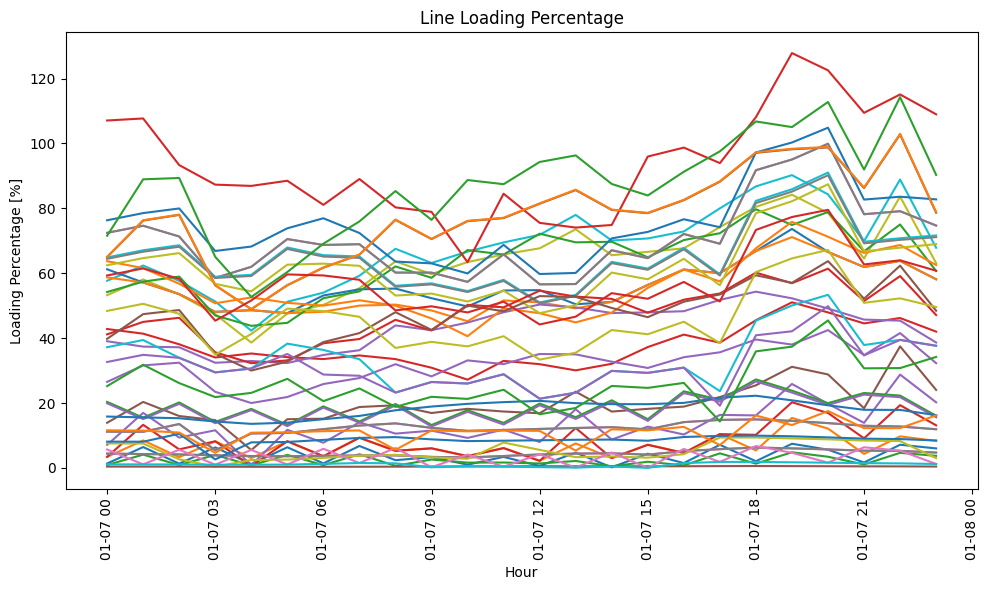

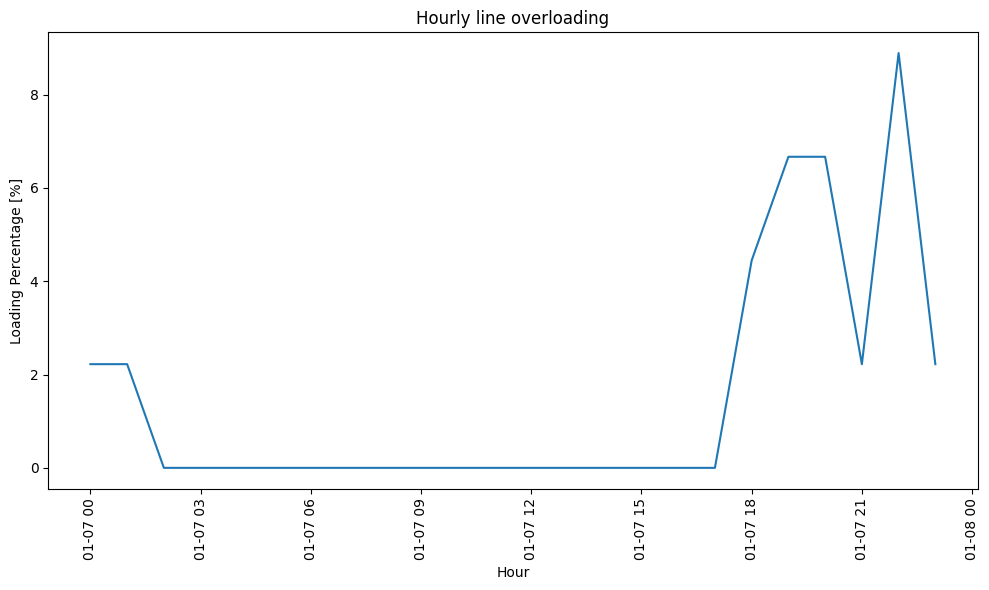

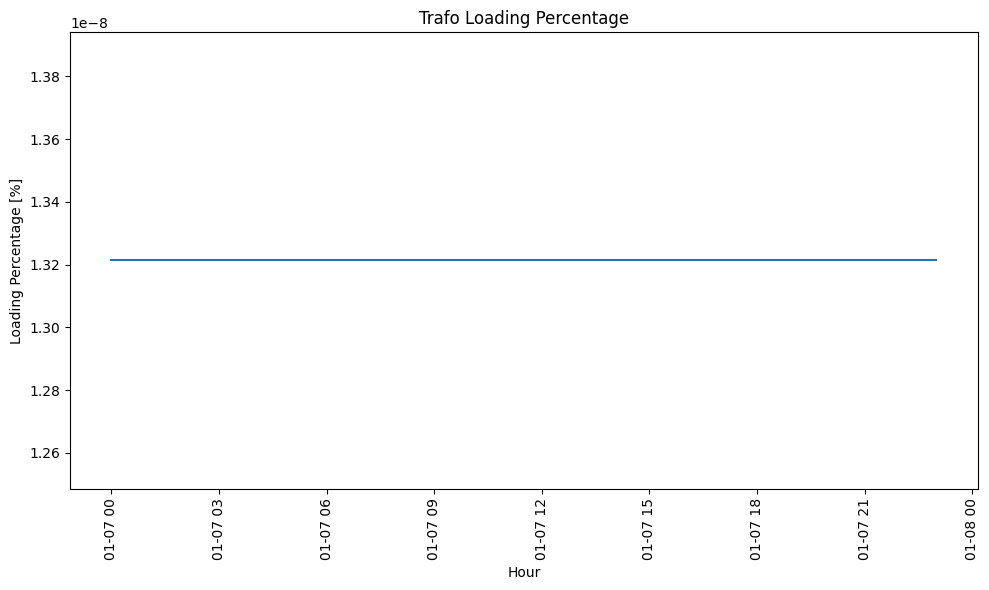

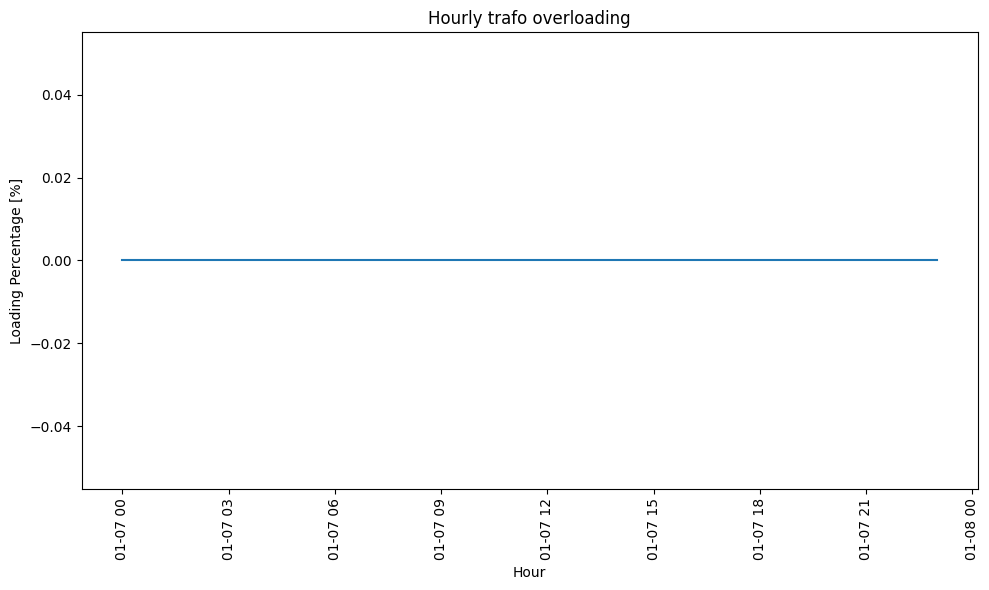

In [11]:
line_controlled = psastat.opt_line_loading(net_optimized)
line_stat_controlled = psastat.opt_line_overloading_stat(net_optimized)
trafo_controlled = psastat.opt_trafo_loading(net_optimized)
trafo_stat_controlled = psastat.opt_trafo_overloading_stat(net_optimized)


fig,ax=plt.subplots(figsize=(10,6))
ax.plot(line_controlled)
ax.set_title("Line Loading Percentage")
# ax.set_ylim([-5,line_controlled.max()])
ax.set_xlabel("Hour")
ax.set_ylabel("Loading Percentage [%]")
ax.tick_params(axis='x', rotation=90)
plt.tight_layout()

fig,ax=plt.subplots(figsize=(10,6))
ax.plot(line_stat_controlled)
ax.set_title("Hourly line overloading")
# ax.set_ylim([-5,line_controlled.max()])
ax.set_xlabel("Hour")
ax.set_ylabel("Loading Percentage [%]")
ax.tick_params(axis='x', rotation=90)
plt.tight_layout()

fig,ax=plt.subplots(figsize=(10,6))
ax.plot(trafo_controlled)
ax.set_title("Trafo Loading Percentage")

ax.set_xlabel("Hour")
ax.set_ylabel("Loading Percentage [%]")
ax.tick_params(axis='x', rotation=90)
plt.tight_layout()

fig,ax=plt.subplots(figsize=(10,6))
ax.plot(trafo_stat_controlled)
ax.set_title("Hourly trafo overloading")

ax.set_xlabel("Hour")
ax.set_ylabel("Loading Percentage [%]")
ax.tick_params(axis='x', rotation=90)
plt.tight_layout()


In [46]:
pv_id = net_optimized.generators.loc[net_optimized.generators.index.str.contains('PV')].index
(net_optimized.generators_t.p[pv_id]+m.variables['PV_to_node'].solution.to_dataframe().reset_index().pivot(index='snapshot',columns='Generator',values='solution'))/net_optimized.generators_t.p_set[pv_id]


Generator,External_grid_230-212_1_3,PV_230-212_1_3_node_103_5621103,PV_230-212_1_3_node_130_5623364,PV_230-212_1_3_node_130_5623366,PV_230-212_1_3_node_130_5623367,PV_230-212_1_3_node_131_5621078,PV_230-212_1_3_node_132_5621071,PV_230-212_1_3_node_132_5621072,PV_230-212_1_3_node_132_5621079,PV_230-212_1_3_node_132_5621152,...,PV_230-212_1_3_node_63_5621051,PV_230-212_1_3_node_63_5621052,PV_230-212_1_3_node_74_5621167,PV_230-212_1_3_node_74_5621184,PV_230-212_1_3_node_77_5621163,PV_230-212_1_3_node_77_5621185,PV_230-212_1_3_node_77_5621187,PV_230-212_1_3_node_87_5621021,PV_230-212_1_3_node_87_5621032,PV_230-212_1_3_node_90_5621136
snapshot,,,,,,,,,,,,,,,,,,,,,
2050-01-07 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2050-01-07 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2050-01-07 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2050-01-07 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2050-01-07 04:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2050-01-07 05:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2050-01-07 06:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2050-01-07 07:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2050-01-07 08:00:00,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [29]:
# Fix power 
pv_id = net_optimized.generators.loc[net_optimized.generators.index.str.contains('PV')].index
net_optimized.generators_t.p_set[pv_id] = net_optimized.generators_t.p[pv_id]
net_optimized.generators_t.q_set[pv_id] = np.tan(np.arccos(0.97))*net_optimized.generators_t.p[pv_id]

net_optimized.storage_units_t.p_set = net_optimized.storage_units_t.p
net_optimized.storage_units_t.q_set = np.tan(np.arccos(0.97))*net_optimized.storage_units_t.p
net_optimized.storage_units_t.inflow=m.variables['node_to_EV'].solution.to_dataframe().reset_index().pivot(index='snapshot',columns='StorageUnit',values='solution') # Add inflow from PV charging

In [30]:
net_optimized.lpf()
net_optimized.pf(use_seed=True)

INFO:pypsa.pf:Performing linear load-flow on AC sub-network SubNetwork 0 for snapshot(s) DatetimeIndex(['2050-01-07 00:00:00', '2050-01-07 01:00:00',
               '2050-01-07 02:00:00', '2050-01-07 03:00:00',
               '2050-01-07 04:00:00', '2050-01-07 05:00:00',
               '2050-01-07 06:00:00', '2050-01-07 07:00:00',
               '2050-01-07 08:00:00', '2050-01-07 09:00:00',
               '2050-01-07 10:00:00', '2050-01-07 11:00:00',
               '2050-01-07 12:00:00', '2050-01-07 13:00:00',
               '2050-01-07 14:00:00', '2050-01-07 15:00:00',
               '2050-01-07 16:00:00', '2050-01-07 17:00:00',
               '2050-01-07 18:00:00', '2050-01-07 19:00:00',
               '2050-01-07 20:00:00', '2050-01-07 21:00:00',
               '2050-01-07 22:00:00', '2050-01-07 23:00:00'],
              dtype='datetime64[ns]', name='snapshot', freq='h')
INFO:pypsa.pf:Performing non-linear load-flow on AC sub-network SubNetwork 0 for snapshots DatetimeIndex(['2050-0

{'n_iter': SubNetwork           0
 snapshot              
 2050-01-07 00:00:00  3
 2050-01-07 01:00:00  3
 2050-01-07 02:00:00  3
 2050-01-07 03:00:00  3
 2050-01-07 04:00:00  3
 2050-01-07 05:00:00  3
 2050-01-07 06:00:00  3
 2050-01-07 07:00:00  3
 2050-01-07 08:00:00  3
 2050-01-07 09:00:00  3
 2050-01-07 10:00:00  3
 2050-01-07 11:00:00  3
 2050-01-07 12:00:00  3
 2050-01-07 13:00:00  3
 2050-01-07 14:00:00  3
 2050-01-07 15:00:00  3
 2050-01-07 16:00:00  3
 2050-01-07 17:00:00  3
 2050-01-07 18:00:00  3
 2050-01-07 19:00:00  3
 2050-01-07 20:00:00  3
 2050-01-07 21:00:00  3
 2050-01-07 22:00:00  3
 2050-01-07 23:00:00  3,
 'error': SubNetwork                      0
 snapshot                         
 2050-01-07 00:00:00  4.026207e-10
 2050-01-07 01:00:00  4.026207e-10
 2050-01-07 02:00:00  4.026207e-10
 2050-01-07 03:00:00  4.026207e-10
 2050-01-07 04:00:00  4.026207e-10
 2050-01-07 05:00:00  4.026207e-10
 2050-01-07 06:00:00  4.026207e-10
 2050-01-07 07:00:00  4.026207e-10
 2050-

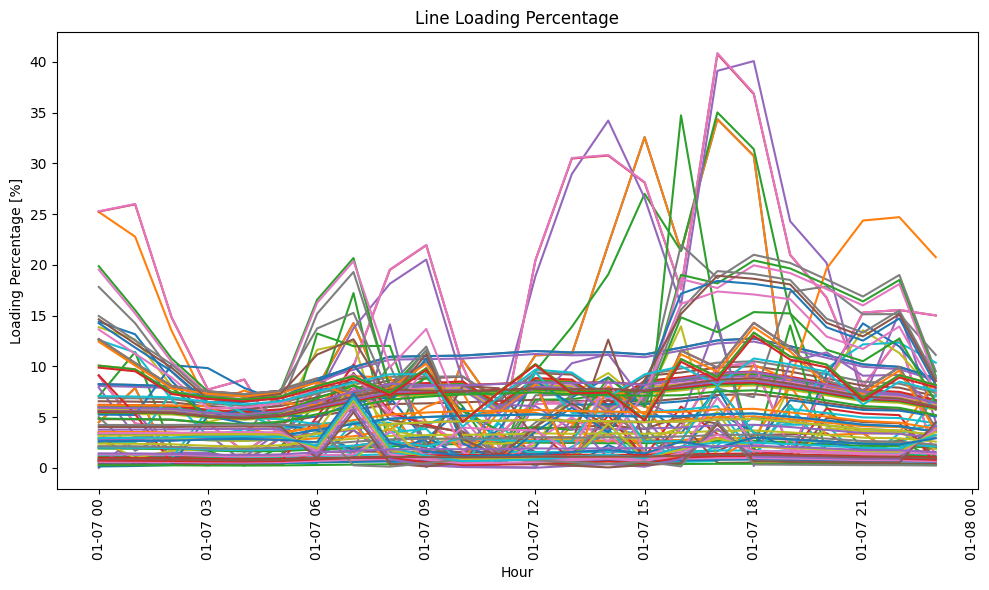

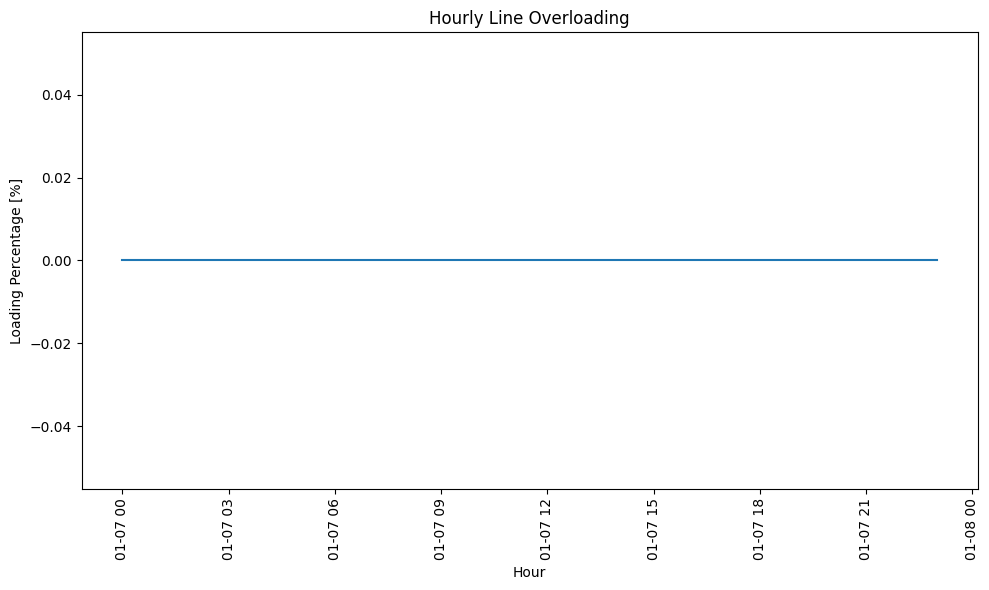

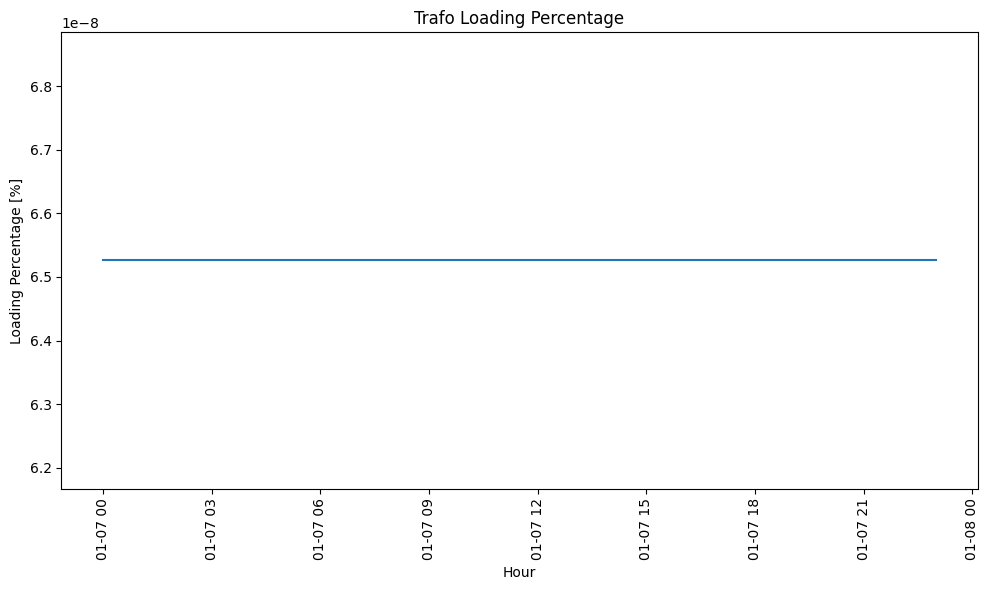

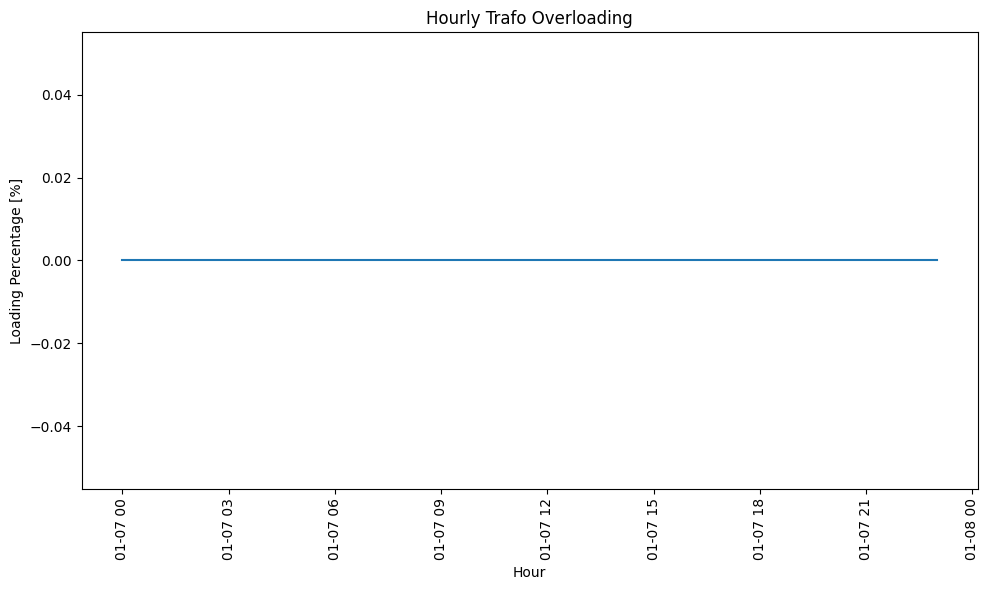

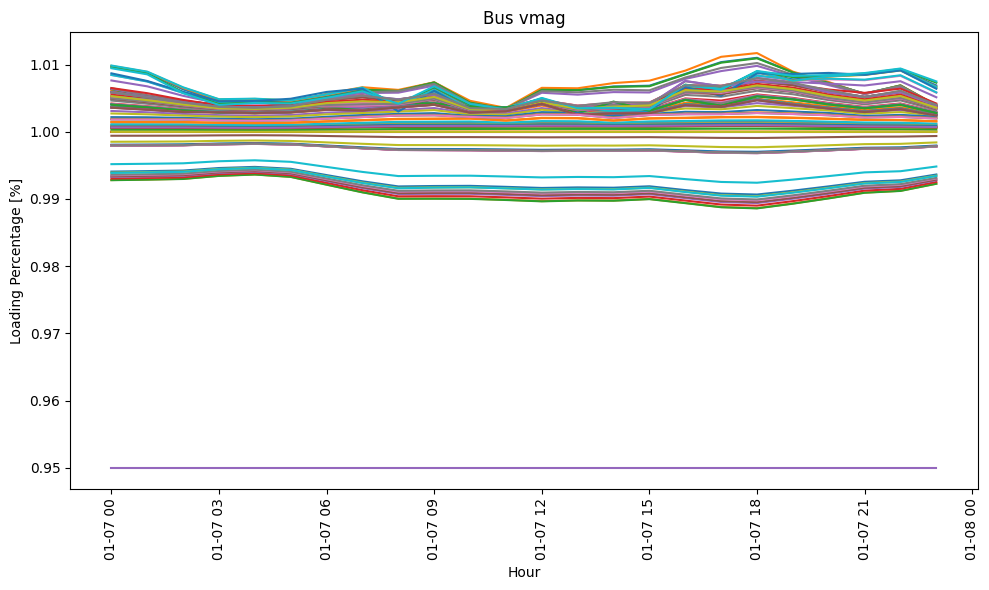

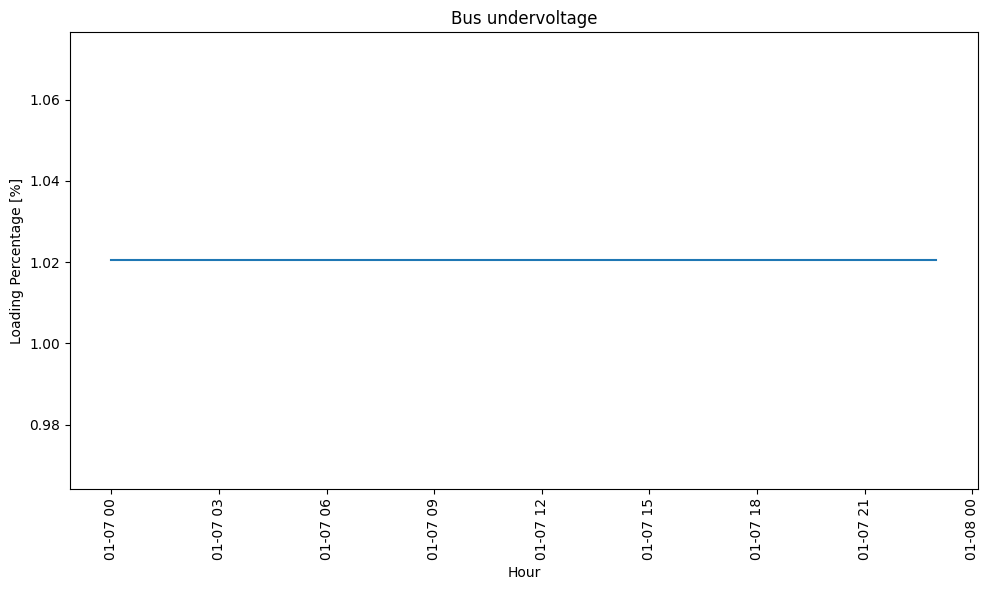

In [31]:
line_controlled = psastat.pf_line_loading(net_optimized)
line_stat_controlled = psastat.pf_line_overloading_stat(net_optimized)
trafo_controlled = psastat.pf_trafo_loading(net_optimized)
trafo_stat_controlled = psastat.pf_trafo_overloading_stat(net_optimized)
bus_vmag = net_optimized.buses_t.v_mag_pu
bus_stat_controlled = psastat.pf_undervoltage(net_optimized)

fig,ax=plt.subplots(figsize=(10,6))
ax.plot(line_controlled)
ax.set_title("Line Loading Percentage")
# ax.set_ylim([-5,line_controlled.max()])
ax.set_xlabel("Hour")
ax.set_ylabel("Loading Percentage [%]")
ax.tick_params(axis='x', rotation=90)
plt.tight_layout()

fig,ax=plt.subplots(figsize=(10,6))
ax.plot(line_stat_controlled)
ax.set_title("Hourly Line Overloading")
# ax.set_ylim([-5,line_controlled.max()])
ax.set_xlabel("Hour")
ax.set_ylabel("Loading Percentage [%]")
ax.tick_params(axis='x', rotation=90)
plt.tight_layout()


fig,ax=plt.subplots(figsize=(10,6))
ax.plot(trafo_controlled)
ax.set_title("Trafo Loading Percentage")

ax.set_xlabel("Hour")
ax.set_ylabel("Loading Percentage [%]")
ax.tick_params(axis='x', rotation=90)
plt.tight_layout()


fig,ax=plt.subplots(figsize=(10,6))
ax.plot(trafo_stat_controlled)
ax.set_title("Hourly Trafo Overloading")
# ax.set_ylim([-5,line_controlled.max()])
ax.set_xlabel("Hour")
ax.set_ylabel("Loading Percentage [%]")
ax.tick_params(axis='x', rotation=90)
plt.tight_layout()


fig,ax=plt.subplots(figsize=(10,6))
ax.plot(bus_vmag)
ax.set_title("Bus vmag")

ax.set_xlabel("Hour")
ax.set_ylabel("Loading Percentage [%]")
ax.tick_params(axis='x', rotation=90)
plt.tight_layout()

fig,ax=plt.subplots(figsize=(10,6))
ax.plot(bus_stat_controlled)
ax.set_title("Bus undervoltage")
# ax.set_ylim([-5,line_controlled.max()])
ax.set_xlabel("Hour")
ax.set_ylabel("Loading Percentage [%]")
ax.tick_params(axis='x', rotation=90)
plt.tight_layout()

In [36]:
end_SoE = net_optimized.storage_units_t.state_of_charge.iloc[23].groupby(net_optimized.storage_units.carrier).first()
last_unique = net_optimized.storage_units.groupby('carrier')[['max_hours','p_nom','day_end_SoC']].first()
cap_unique = last_unique.max_hours*last_unique.p_nom
end_SoC = end_SoE/cap_unique*100
unshifted_end_SoC = last_unique.day_end_SoC/(cap_unique)*100

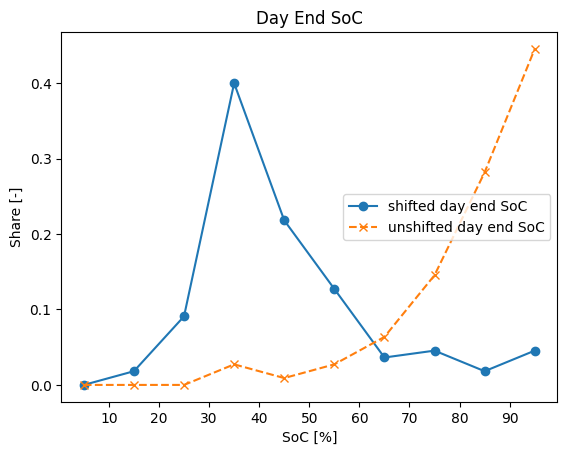

In [37]:
counts, bins = np.histogram(end_SoC, bins=range(0, 110, 10))
counts_unshifted, bins_unshifted = np.histogram(unshifted_end_SoC, bins=range(0, 110, 10))
bin_centers = 0.5 * (bins[1:] + bins[:-1])
plt.xticks(range(0, 110, 10))
plt.plot(bin_centers, counts / counts.sum(), linestyle='-', marker='o', label='shifted day end SoC')
plt.plot(bin_centers, counts_unshifted / counts_unshifted.sum(), linestyle='--', marker='x',
            label='unshifted day end SoC')
plt.xlabel('SoC [%]')
plt.ylabel('Share [-]')
plt.title('Day End SoC')
plt.legend()


Text(0.5, 1.0, 'Scatter Plot of Unshifted End SoC vs End SoC')

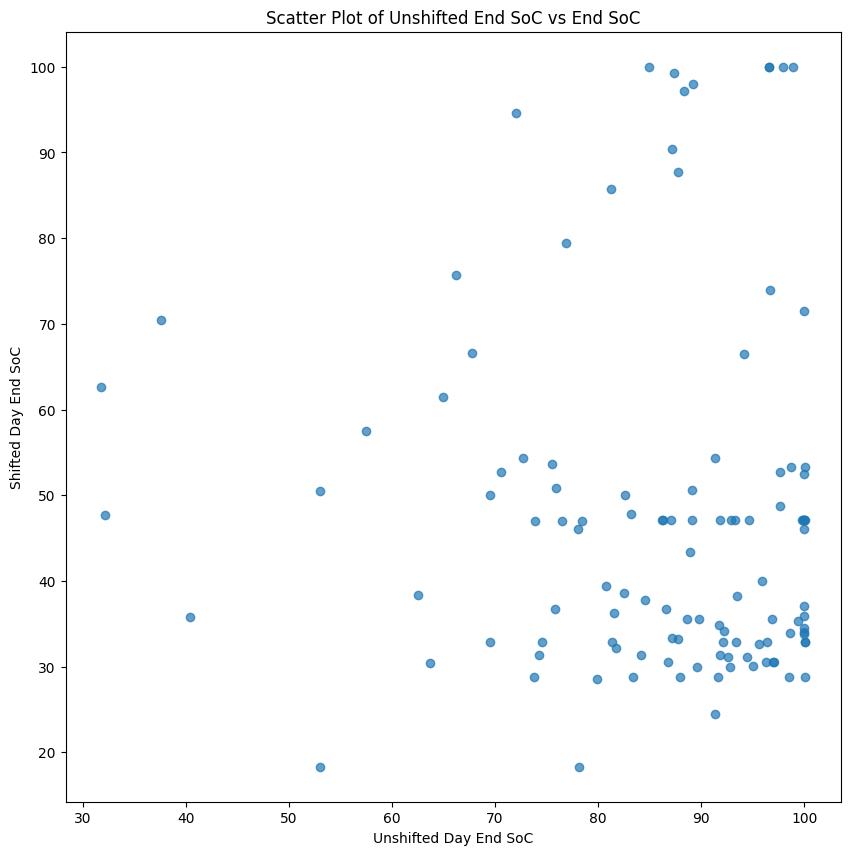

In [38]:
plt.figure(figsize=(10, 10))
plt.scatter(unshifted_end_SoC.values,end_SoC.values, alpha=0.7)
plt.xlabel('Unshifted Day End SoC')
plt.ylabel('Shifted Day End SoC')
plt.title('Scatter Plot of Unshifted End SoC vs End SoC')


In [39]:
def loading_res(net):
    loading_res={}
    loading_res['line_load'] =  psastat.pf_line_loading(net)
    loading_res['line_stat'] =  psastat.pf_line_overloading_stat(net)

    loading_res['trafo_load'] = psastat.pf_trafo_loading(net)
    loading_res['trafo_stat'] = psastat.pf_trafo_overloading_stat(net)

    loading_res['voltage_load'] = net.buses_t.v_mag_pu
    loading_res['voltage_stat'] = psastat.pf_undervoltage(net)
    
    return loading_res


In [51]:
def hourly_visualize(MV_feeder,net, save_paths, loading_res):

        line_load = loading_res['line_load']
        voltage_load = loading_res['voltage_load']
        trafo_load = loading_res['trafo_load']

        for sns in net.snapshots[0:24]:
            fig, ax = plt.subplots(subplot_kw={"projection": ccrs.EqualEarth()}, figsize=(20, 20))
            loads = net.loads.assign(l=net.loads_t.p.loc[sns]).groupby(["bus"]).l.sum()
            gens = net.generators.assign(gen=net.generators_t.p.loc[sns]).groupby(
                ["bus"]).gen.sum()
            ev_net_gen = net.storage_units.assign(ev_net_gen=net.storage_units_t.p.loc[sns]).groupby(["bus"]).ev_net_gen.sum()
            gens = gens.reindex(index=loads.index, fill_value=0)
            net_load = loads - gens-ev_net_gen
            line_loading = np.sqrt(net.lines_t.p0.loc[sns] ** 2 + net.lines_t.q0.loc[
                sns] ** 2) / net.lines.s_nom * 100
            trafo_loading = np.sqrt(
                net.transformers_t.p0.loc[sns] ** 2 + net.transformers_t.q0.loc[
                    sns] ** 2) / net.transformers.s_nom * 100
            collection = net.plot(
                bus_sizes=abs(net_load/5e6),  # proportional to net loading
                bus_colors=net.buses_t.v_mag_pu.loc[sns],  # proportional to v_mag_pu
                bus_cmap=plt.cm.jet_r,
                bus_alpha=1,
                margin=0.05,
                line_widths=1,  # net_controlled.lines_t.p0.max().max(),
                line_colors=line_loading,
                line_cmap=plt.cm.jet,
                transformer_colors=trafo_loading,  # 'Black',
                transformer_widths=10,  # net_controlled.transformers_t.p0.loc[sns],
                transformer_alpha=0.5,
                transformer_cmap=plt.cm.jet,
                projection=ccrs.EqualEarth(),
                color_geomap=True,
                title= str(sns) if MV_feeder else str(sns) + "  " + f"{folder}",
                jitter=5
            )

            bussm = plt.cm.ScalarMappable(cmap=plt.cm.jet_r, norm=mcolors.Normalize(vmin=voltage_load.min().min(),
                                                                                    vmax=voltage_load.max().max()))
            bussm.set_array([])
            linesm = plt.cm.ScalarMappable(cmap=plt.cm.jet, norm=mcolors.Normalize(vmin=line_load.min().min(),
                                                                                   vmax=line_load.max().max()))
            linesm.set_array([])

            cax = fig.add_axes([ax.get_position().x1-0.01, ax.get_position().y0, 0.01, ax.get_position().height])
            cax2 = fig.add_axes([ax.get_position().x1+0.03, ax.get_position().y0, 0.01, ax.get_position().height])
            plt.colorbar(linesm, cax=cax, label="Line Loading [%]")
            plt.colorbar(bussm, cax=cax2, label="Bus v_mag_pu [-]")

            if MV_feeder:
                trafosm = plt.cm.ScalarMappable(cmap=plt.cm.jet,norm=mcolors.Normalize(vmin=trafo_load.min().min(), vmax=trafo_load.max().max()))
                trafosm.set_array([])
                cax3 = fig.add_axes([ax.get_position().x1+0.07, ax.get_position().y0,0.01,ax.get_position().height])
                plt.colorbar(trafosm,cax=cax3,label="Trafo Loading [%]")

            plt.subplots_adjust(right=0.9)
            plt.show()
            # plt.savefig((f"{save_paths[i]}/hourly_visualize_{sns}.png"))

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



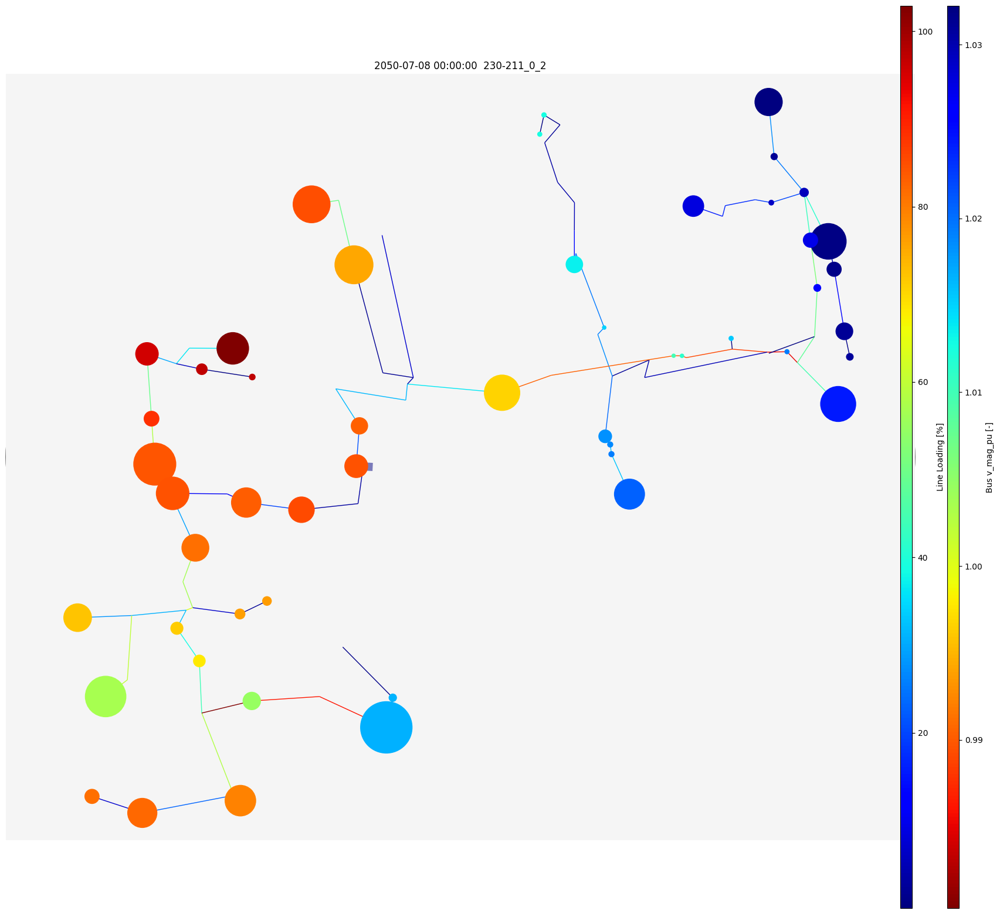

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



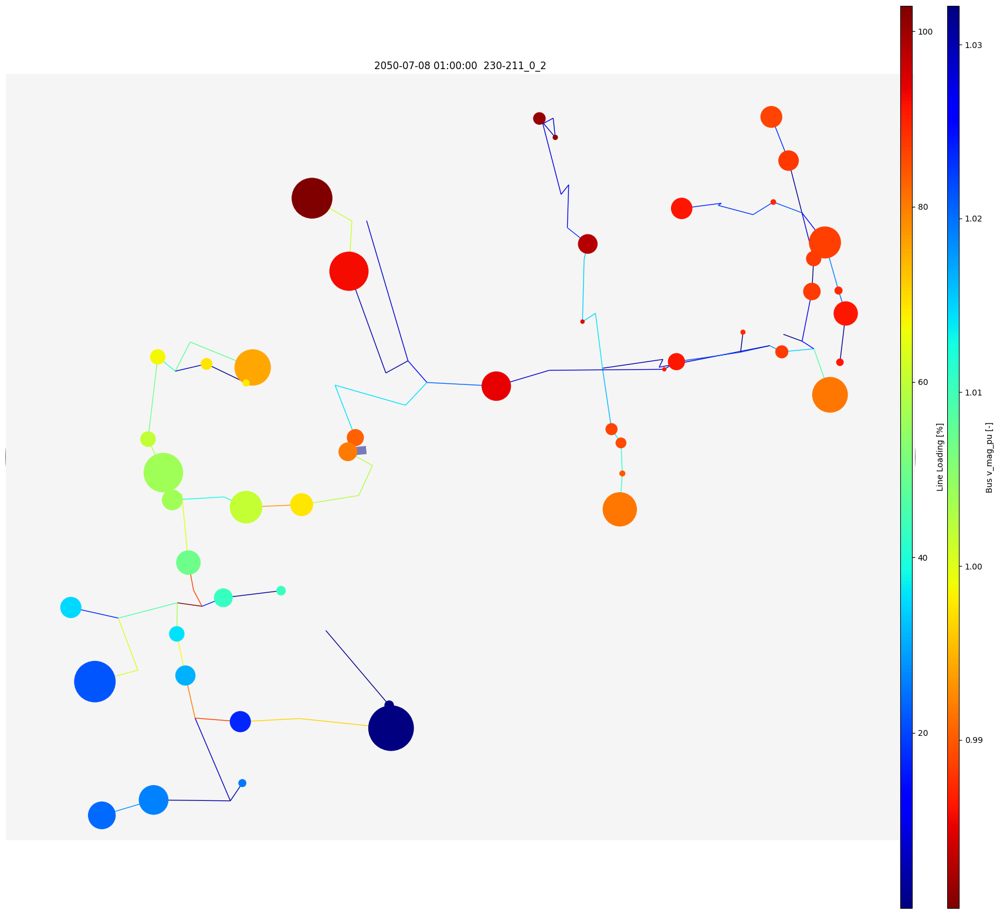

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



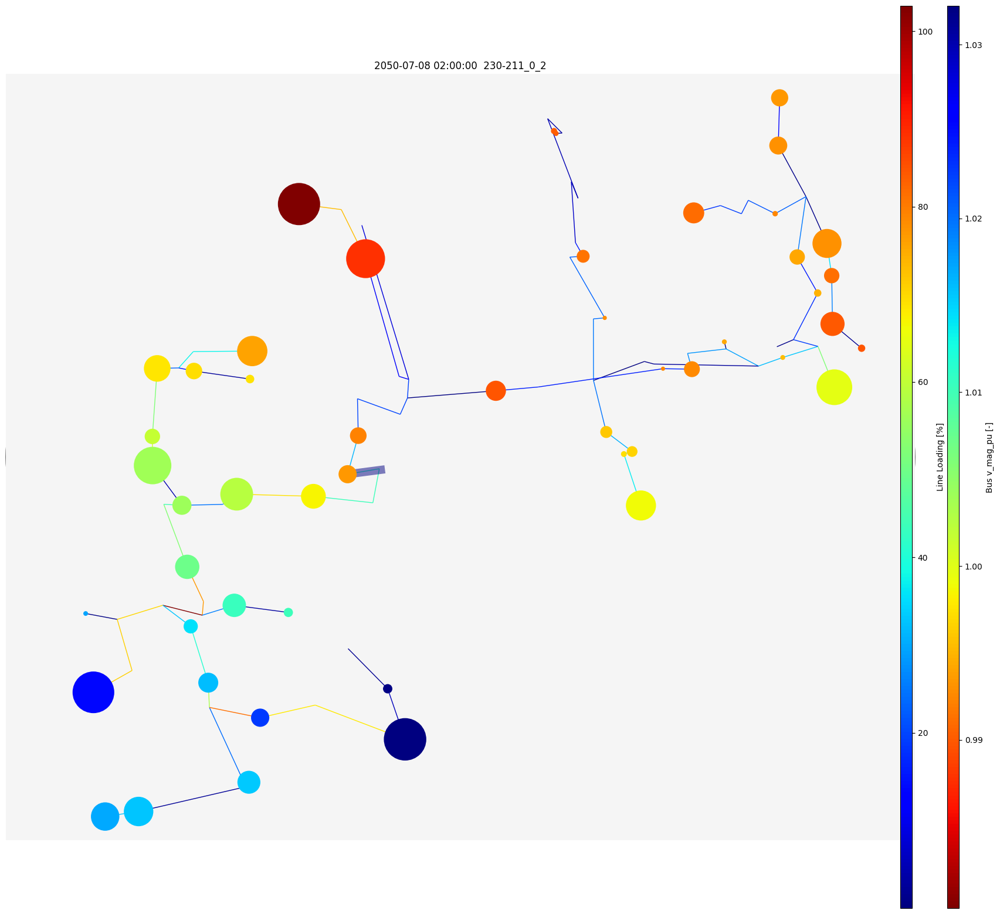

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



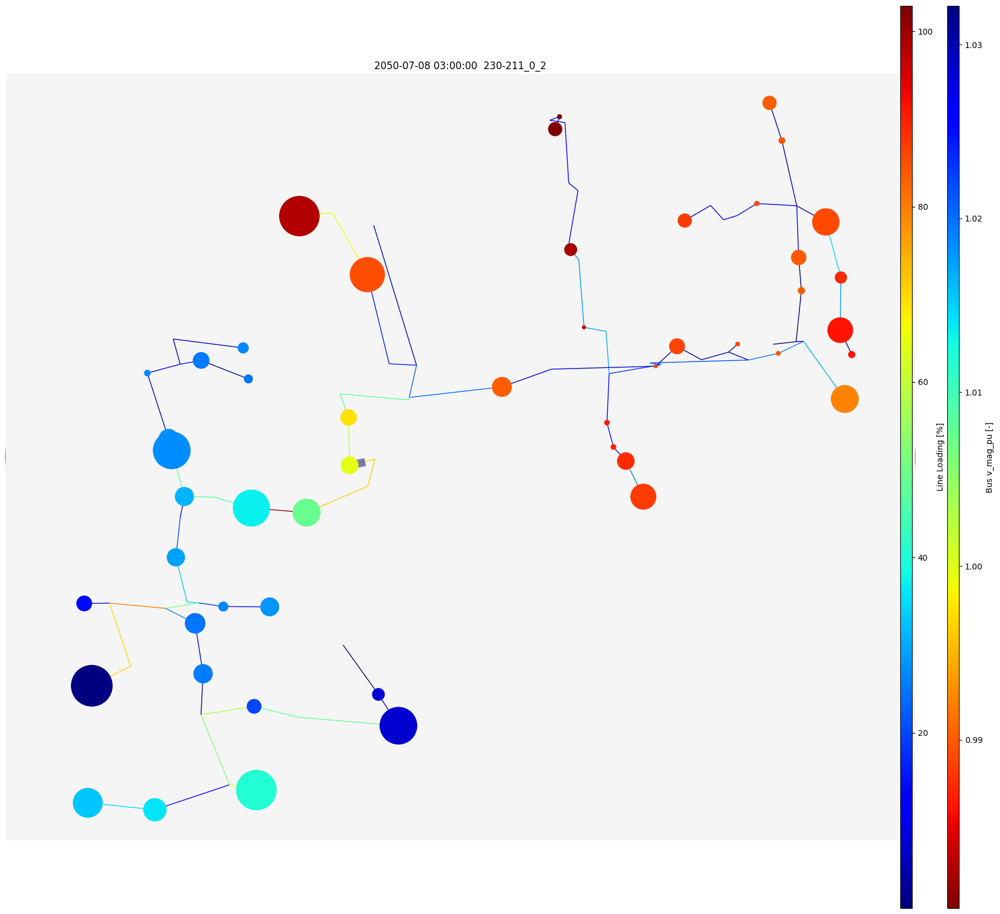

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



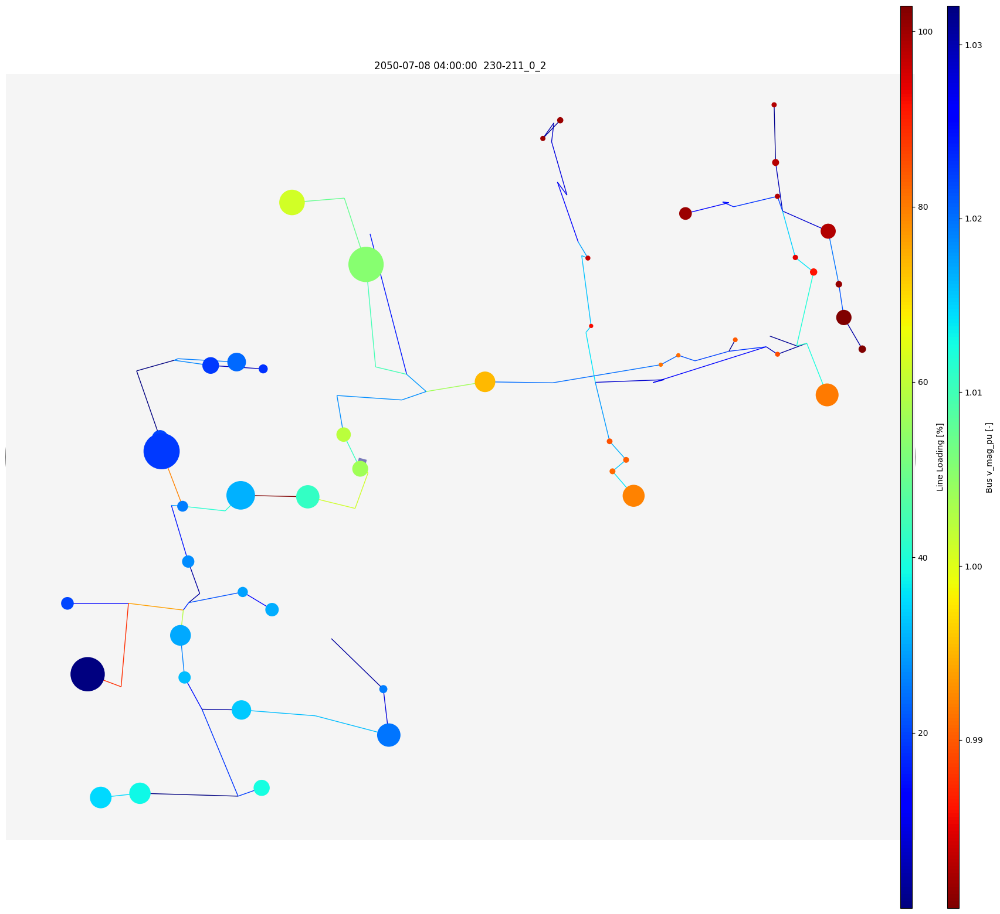

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



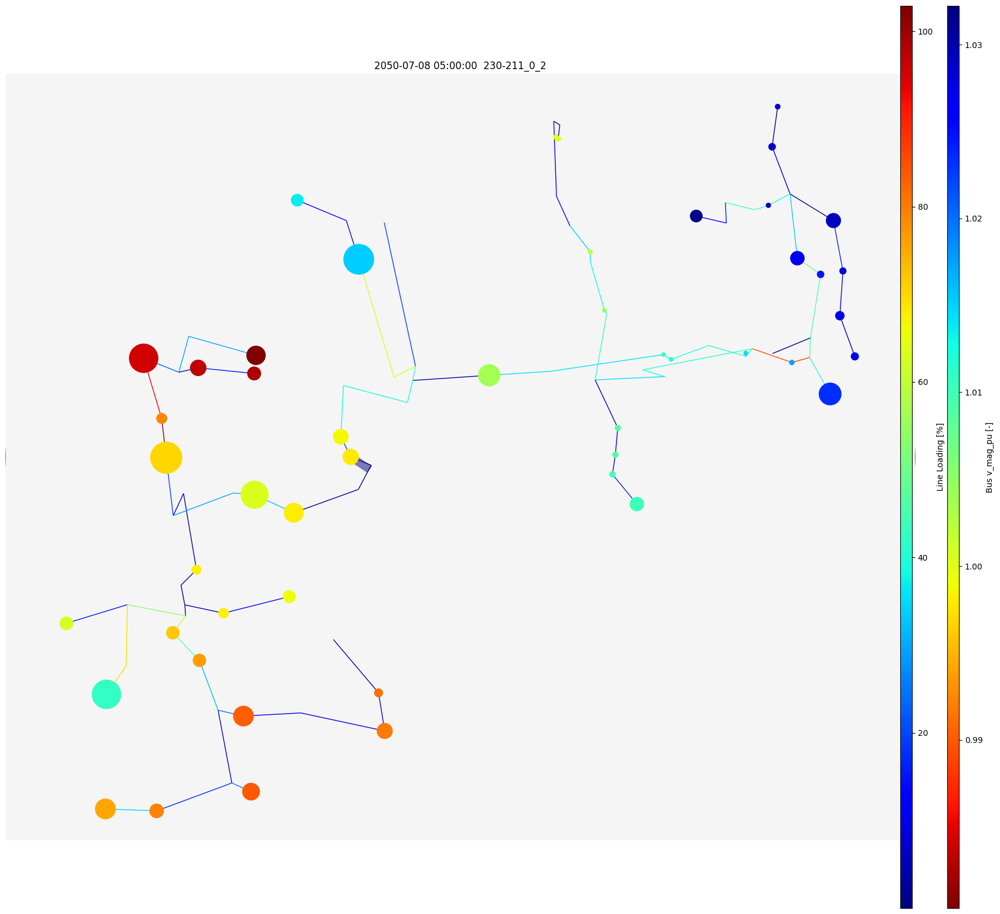

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



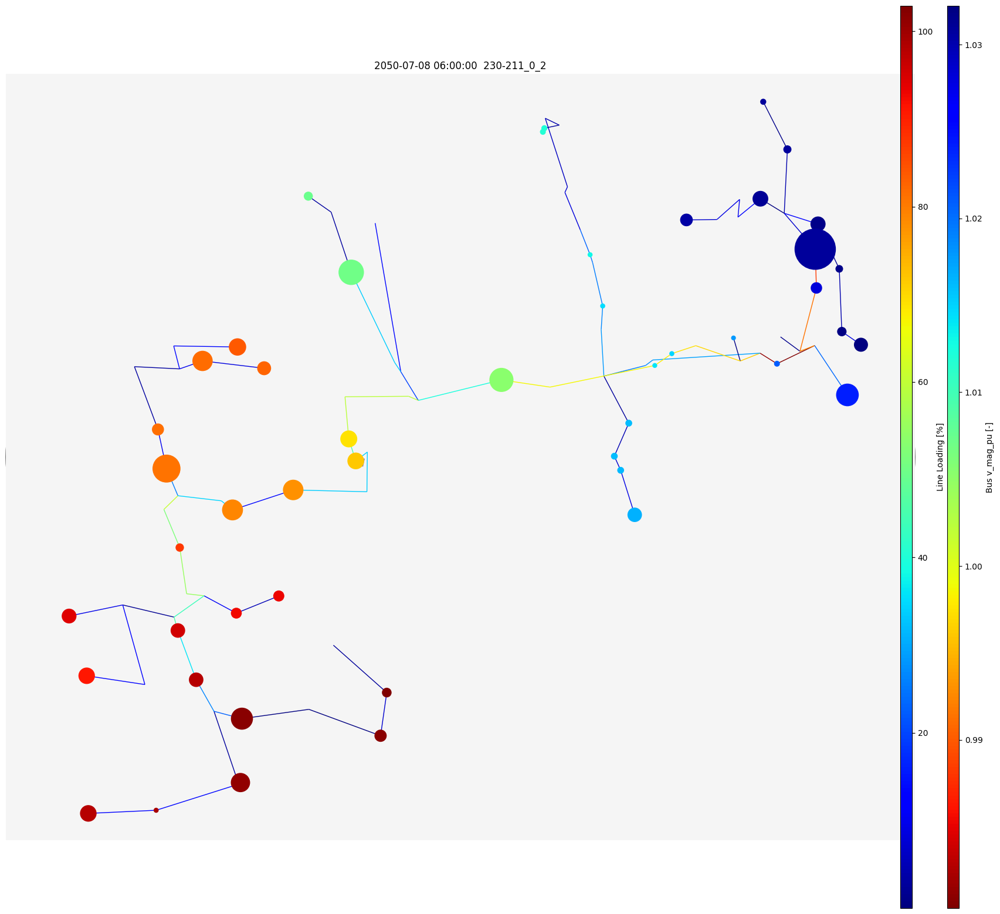

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



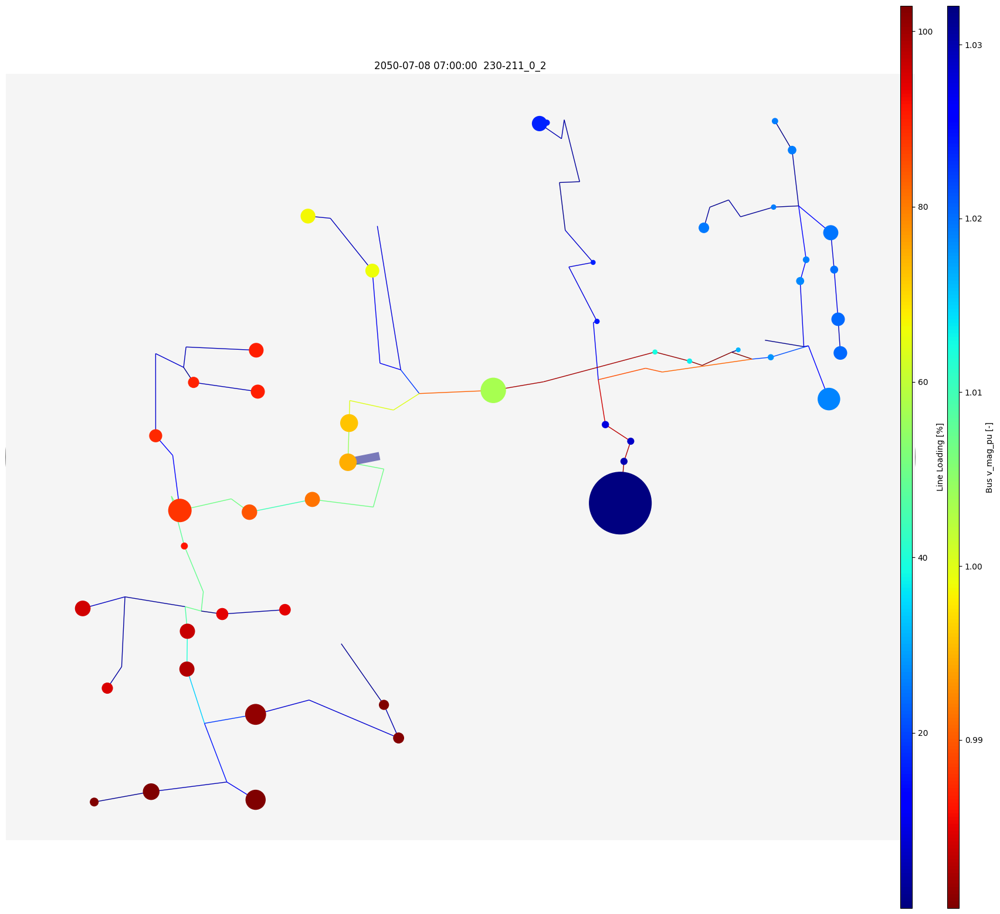

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



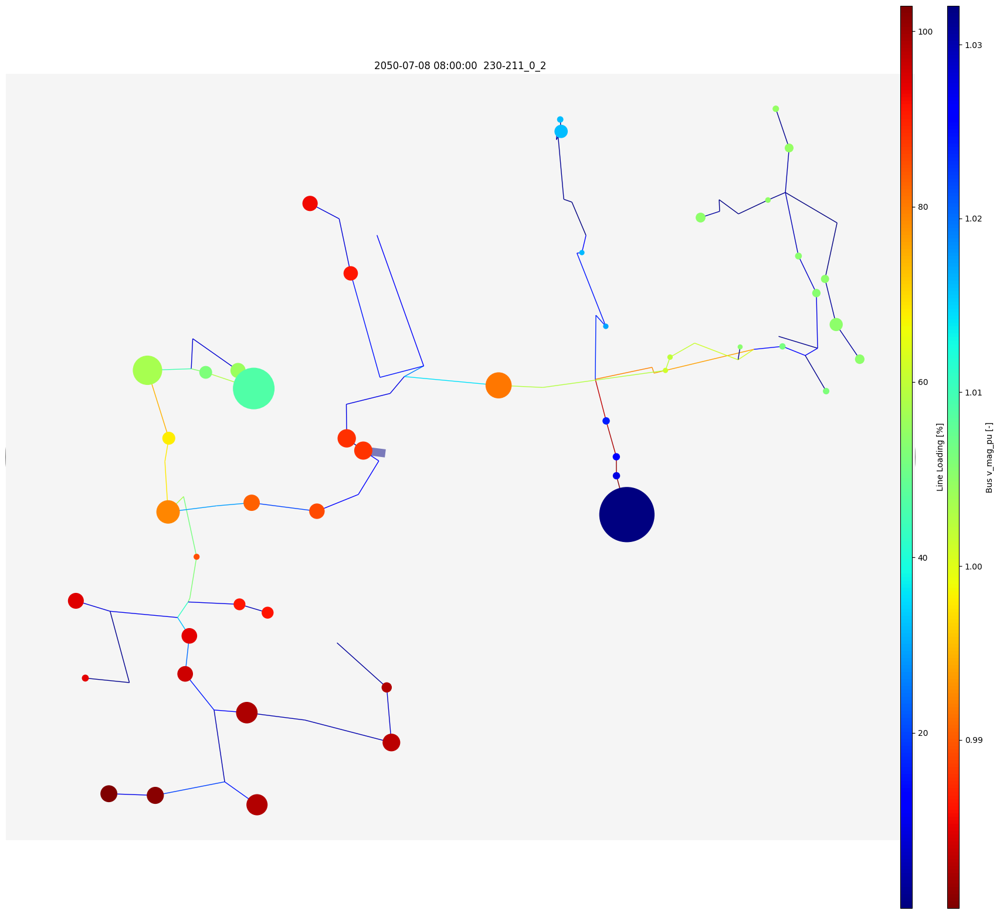

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



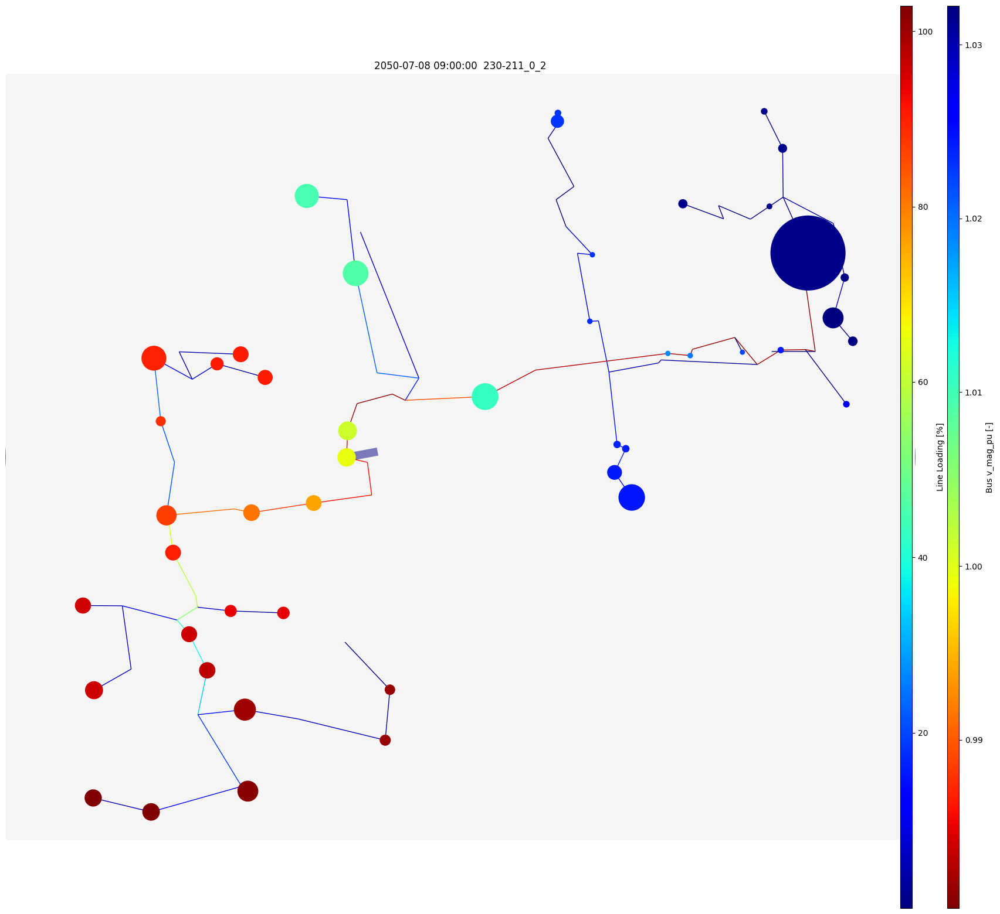

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



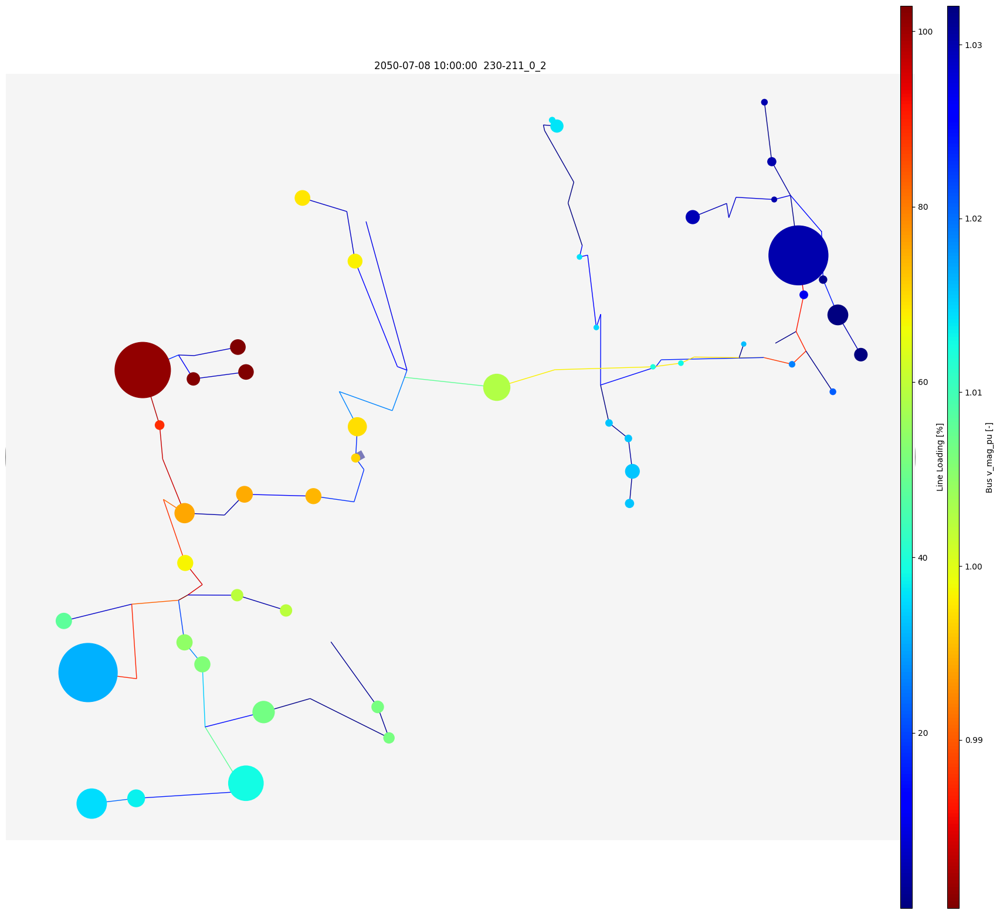

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



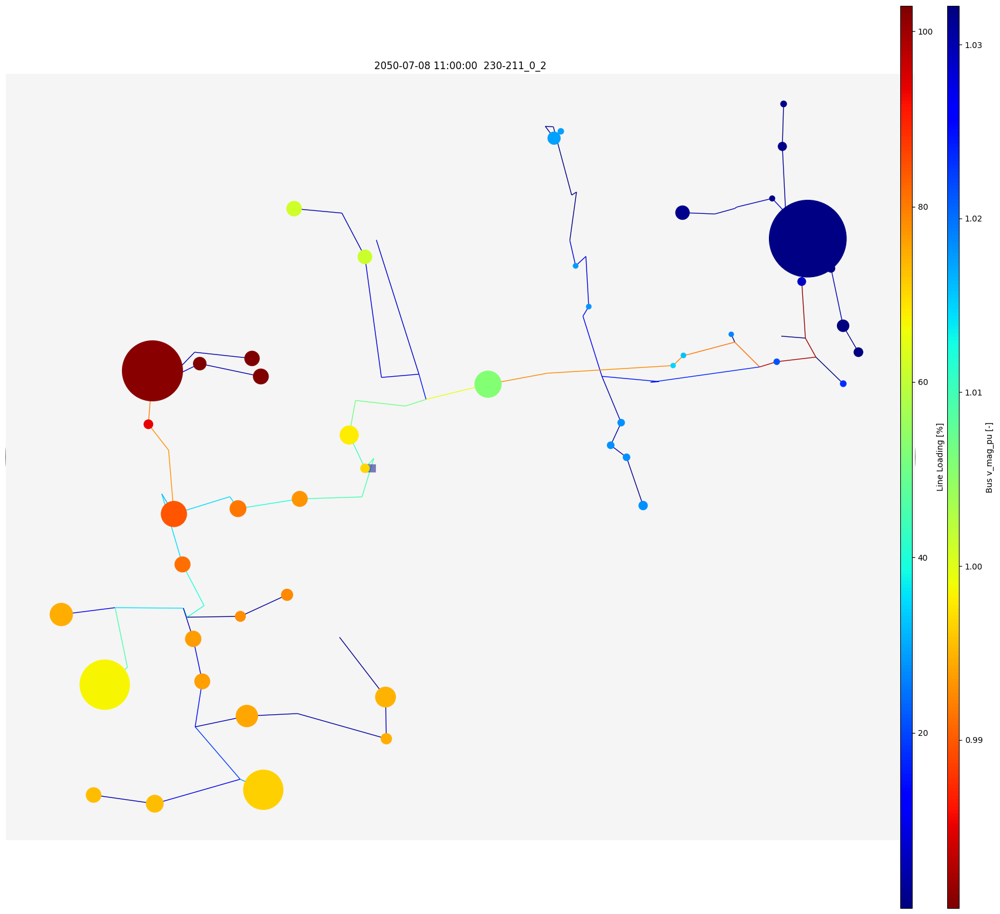

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



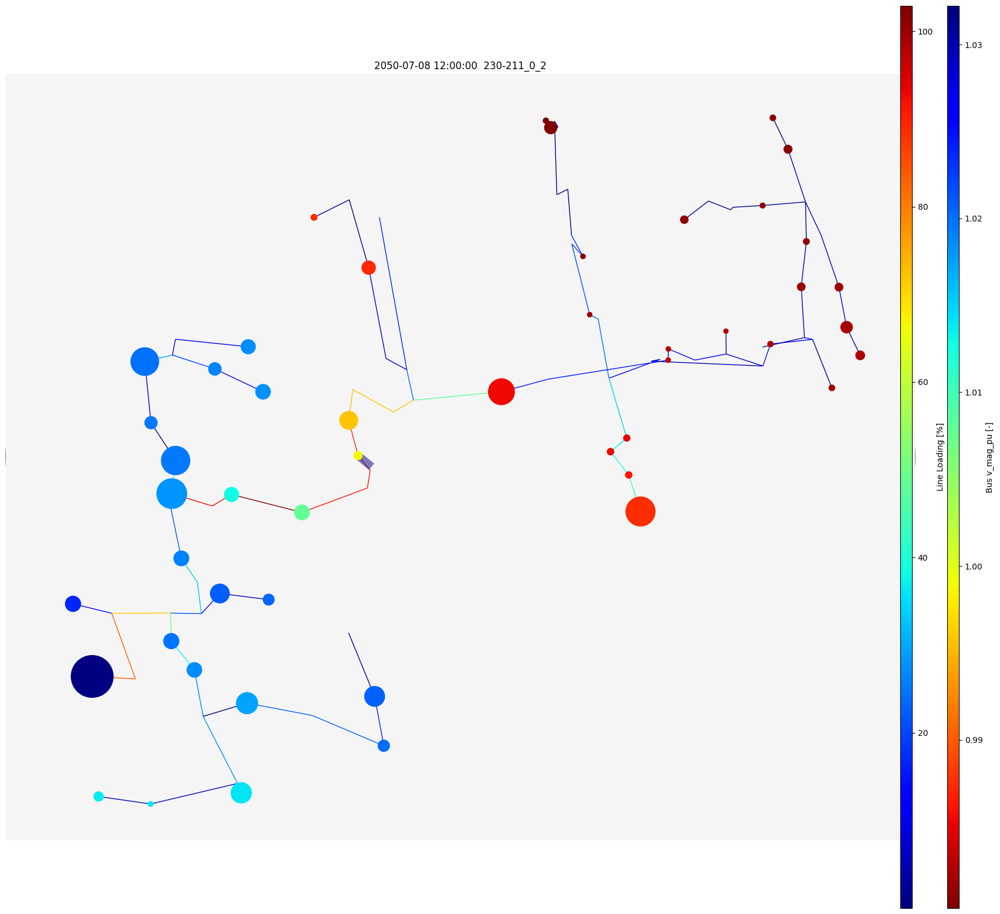

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



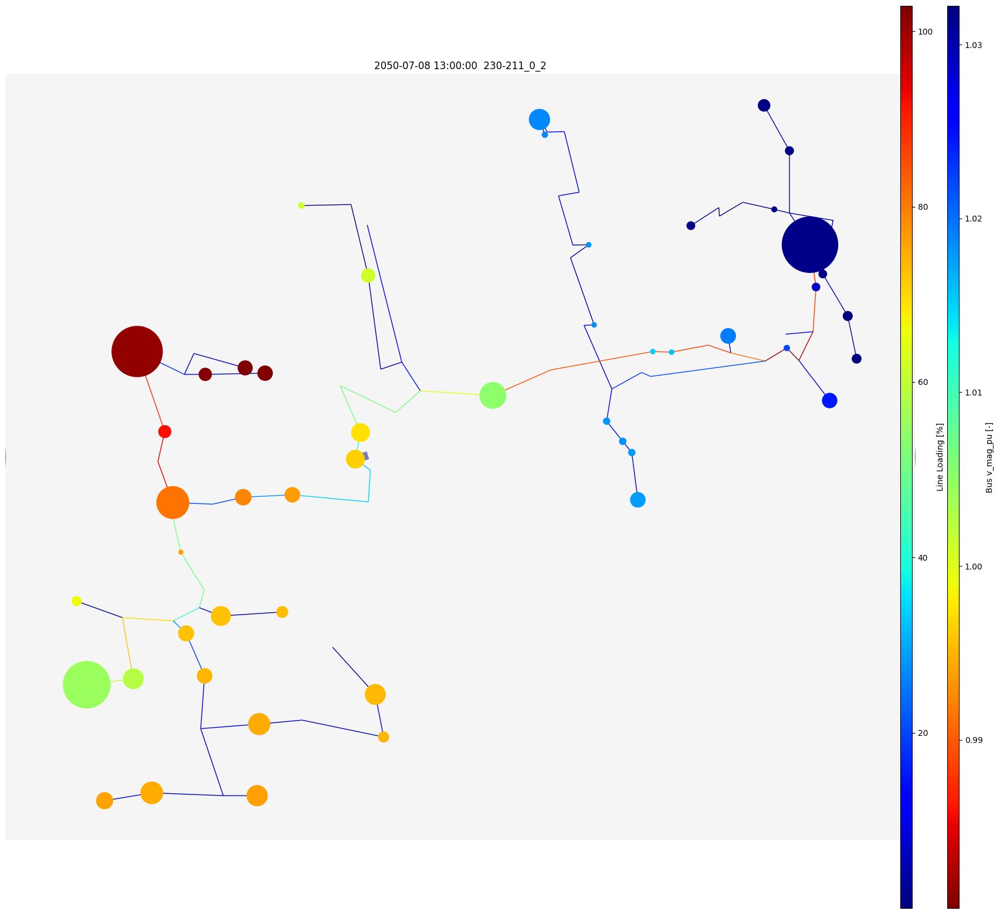

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



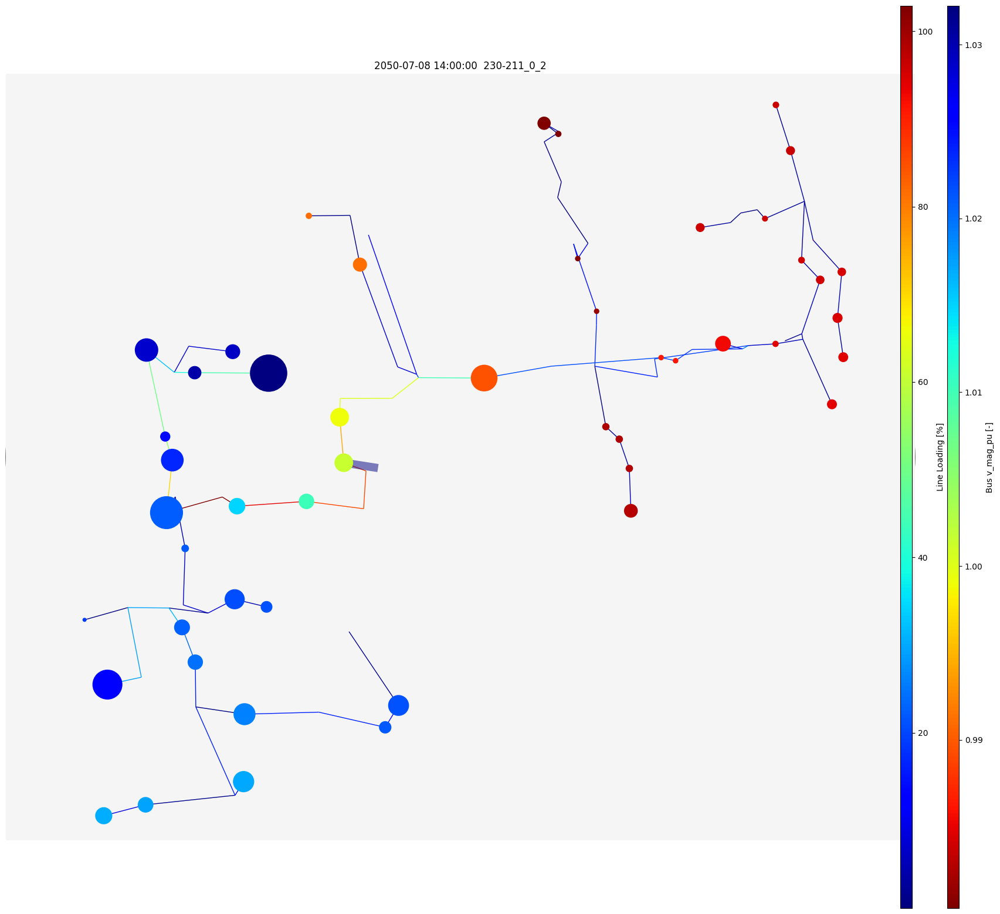

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



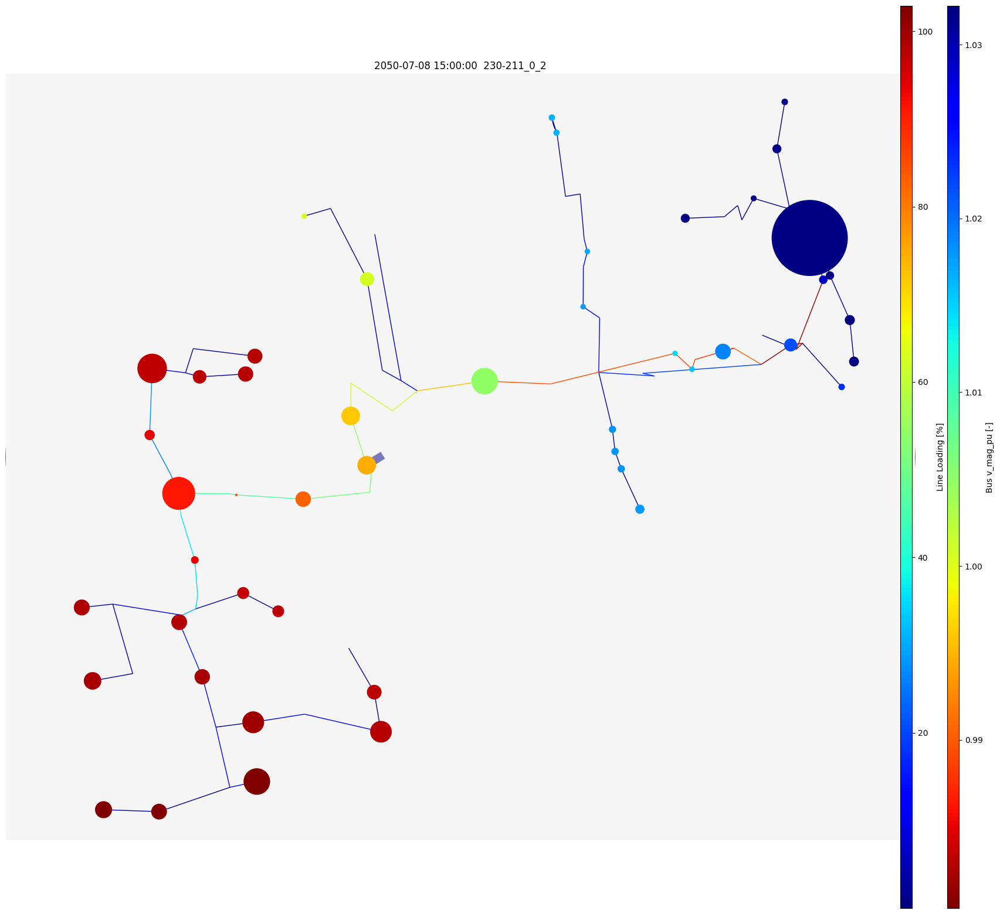

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



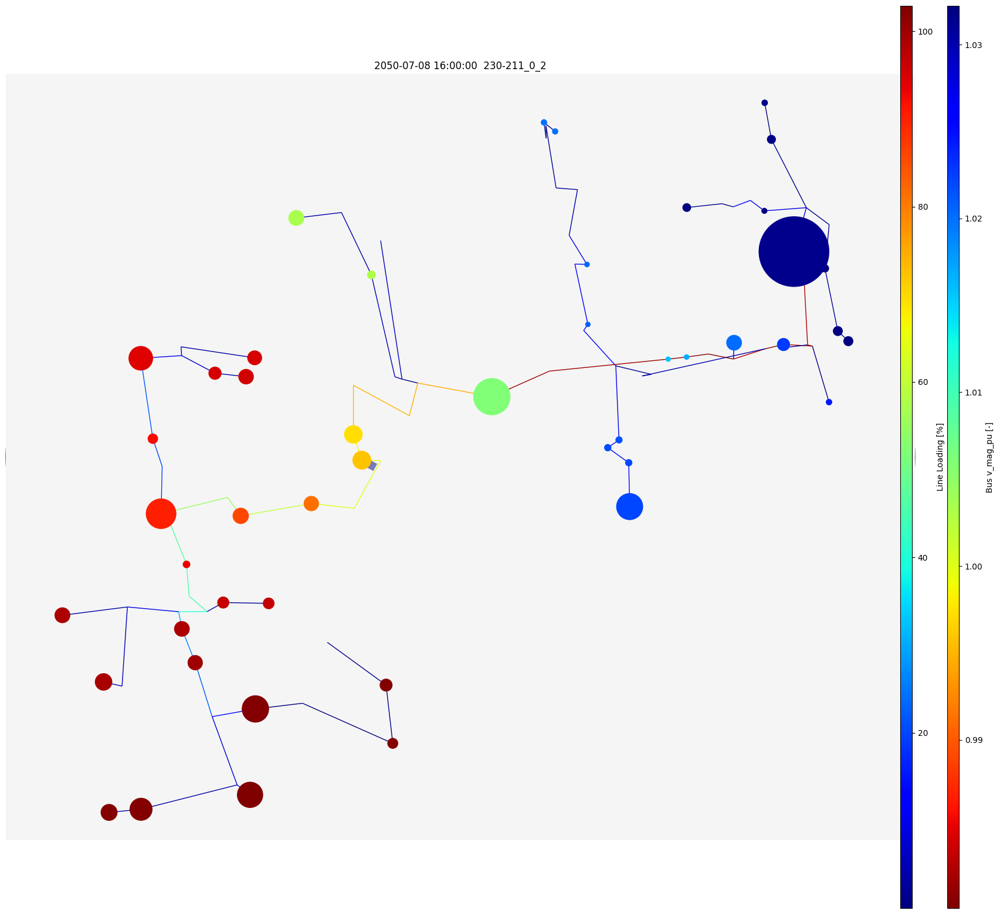

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



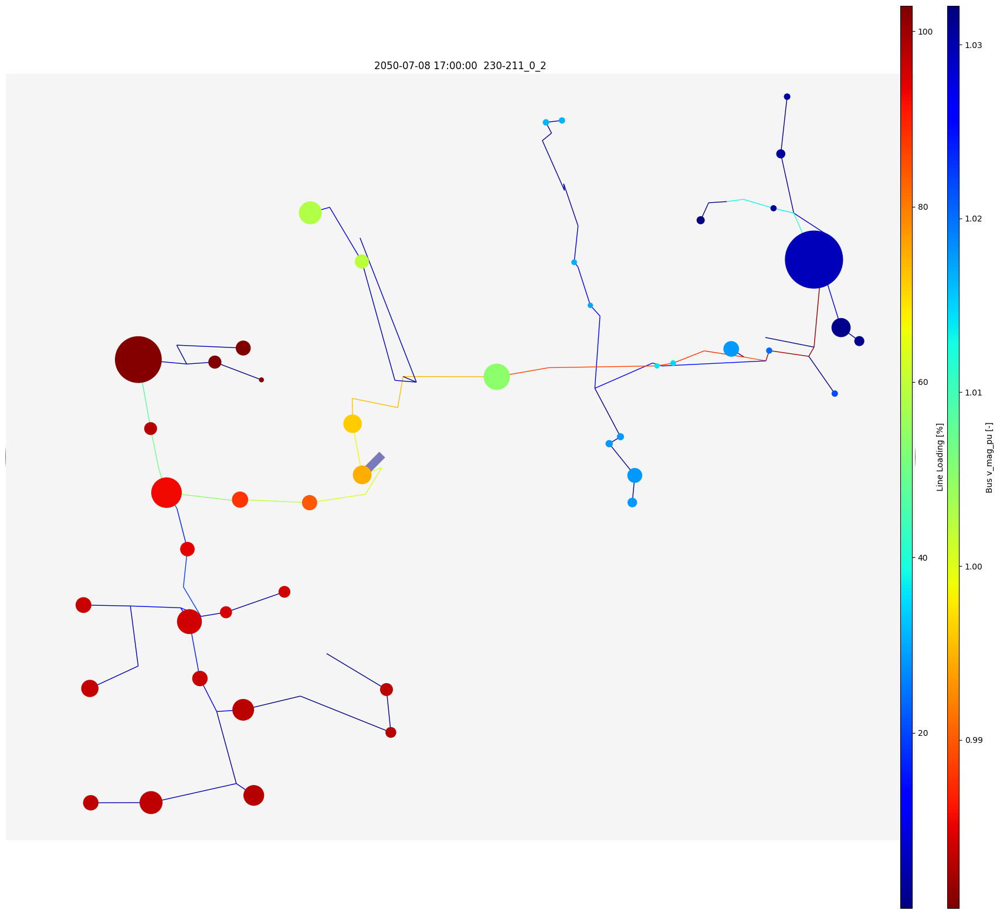

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



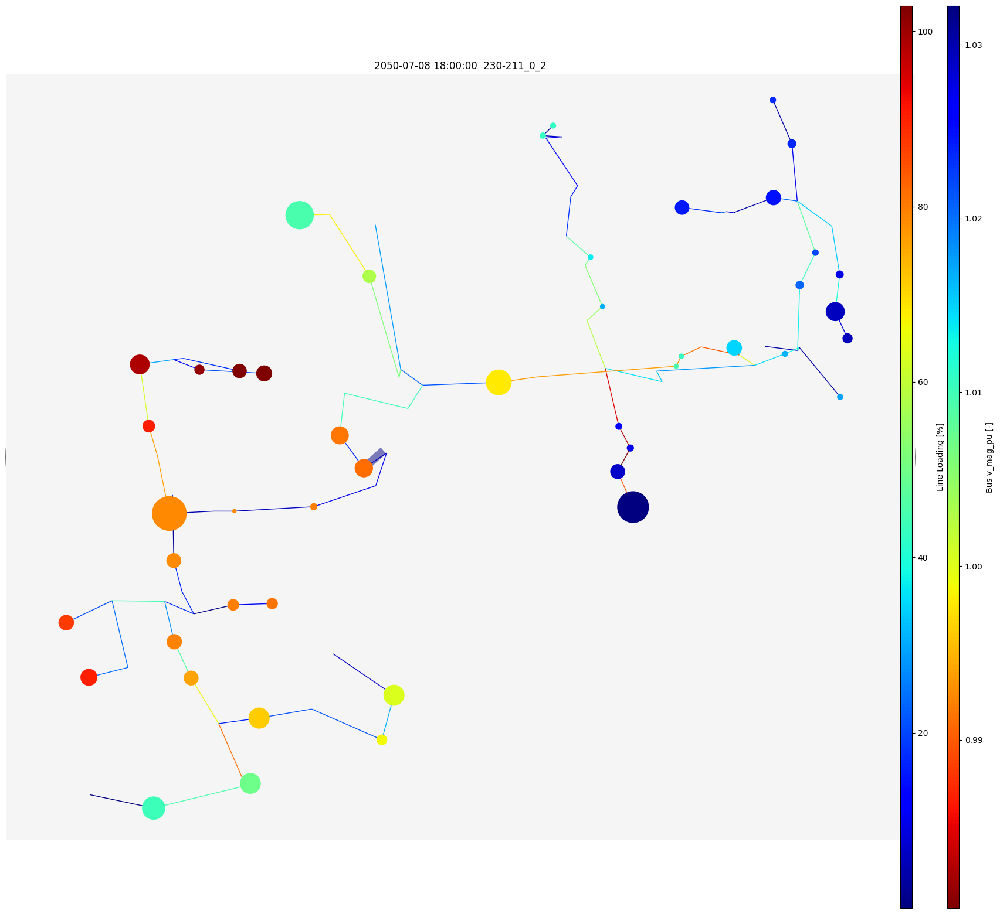

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



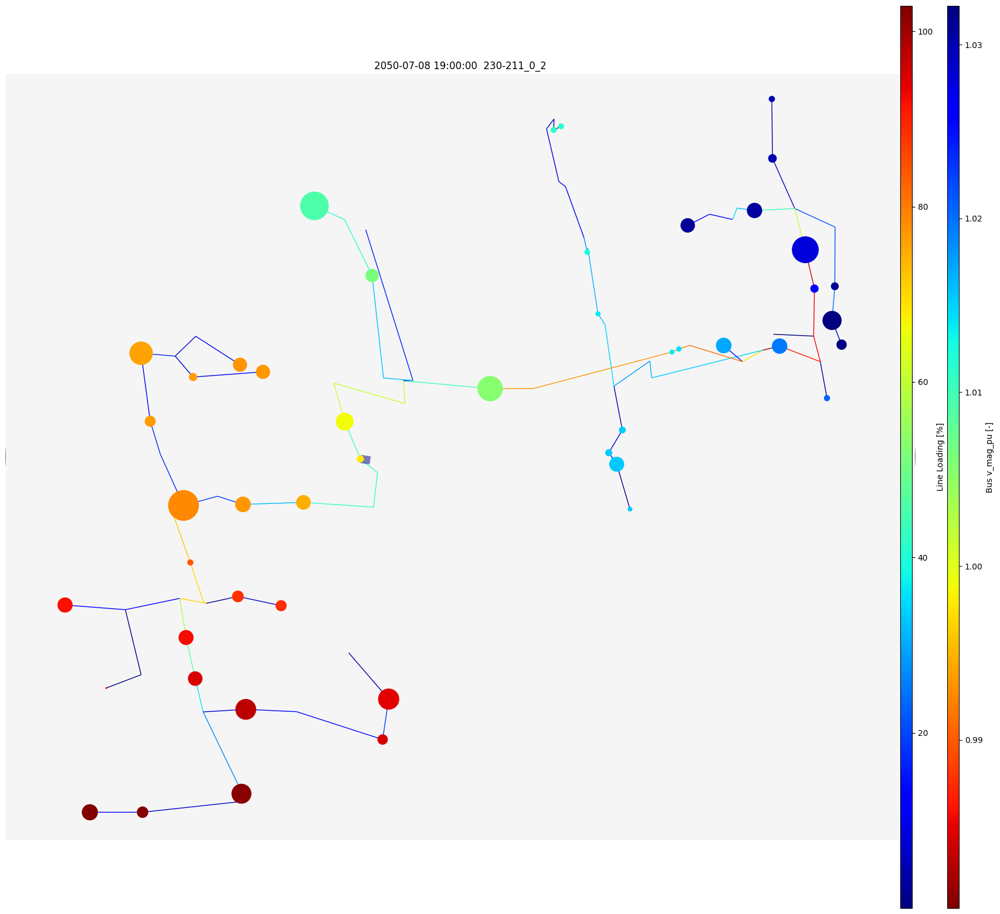

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



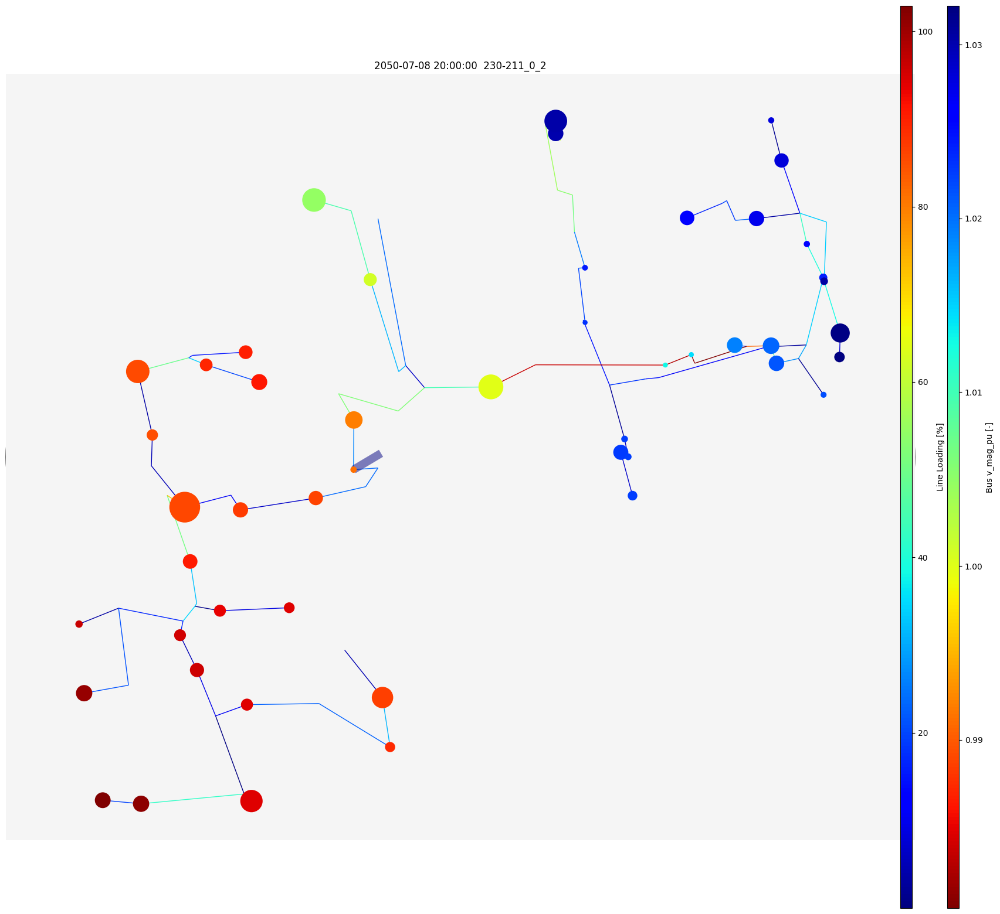

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



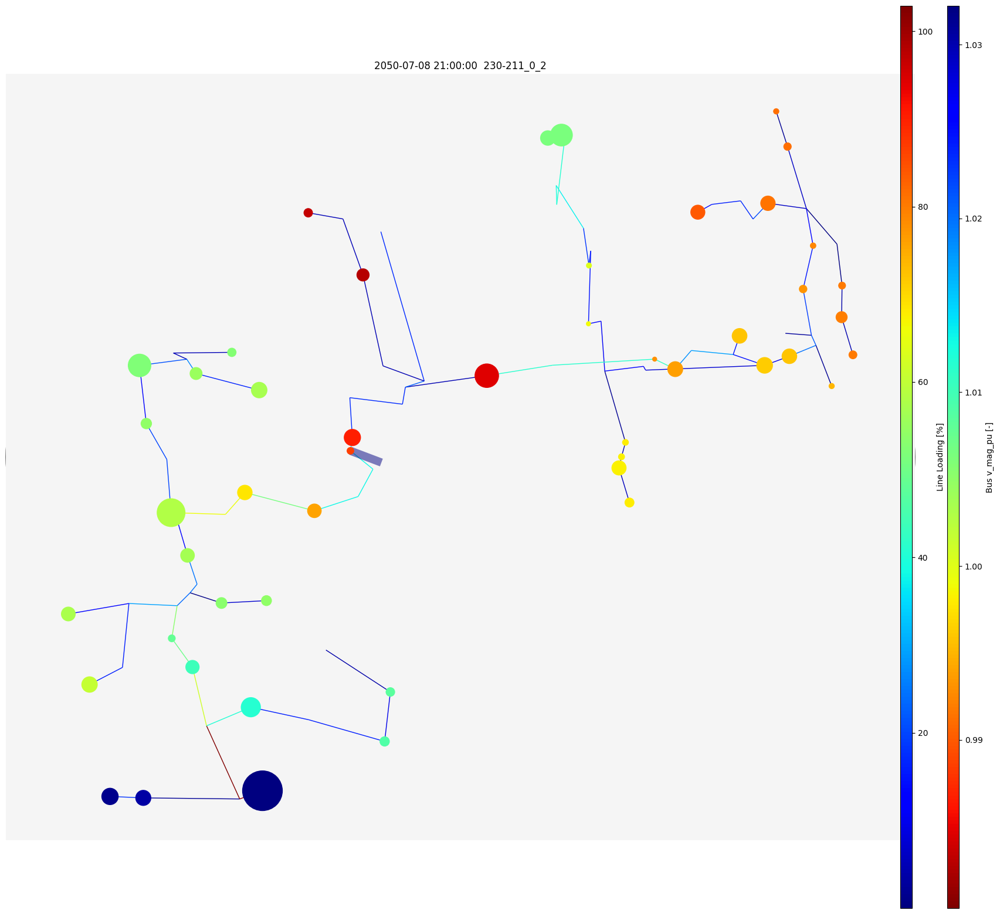

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



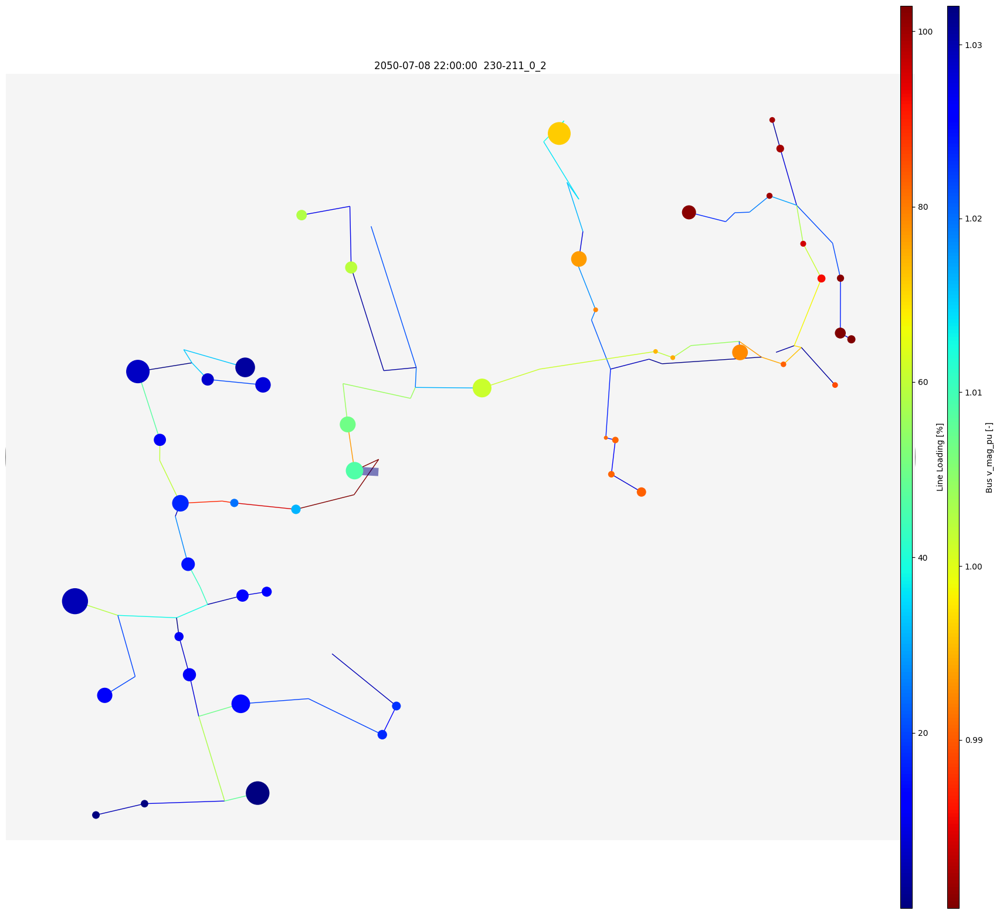

/usr/local/Caskroom/miniforge/base/envs/vtog/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



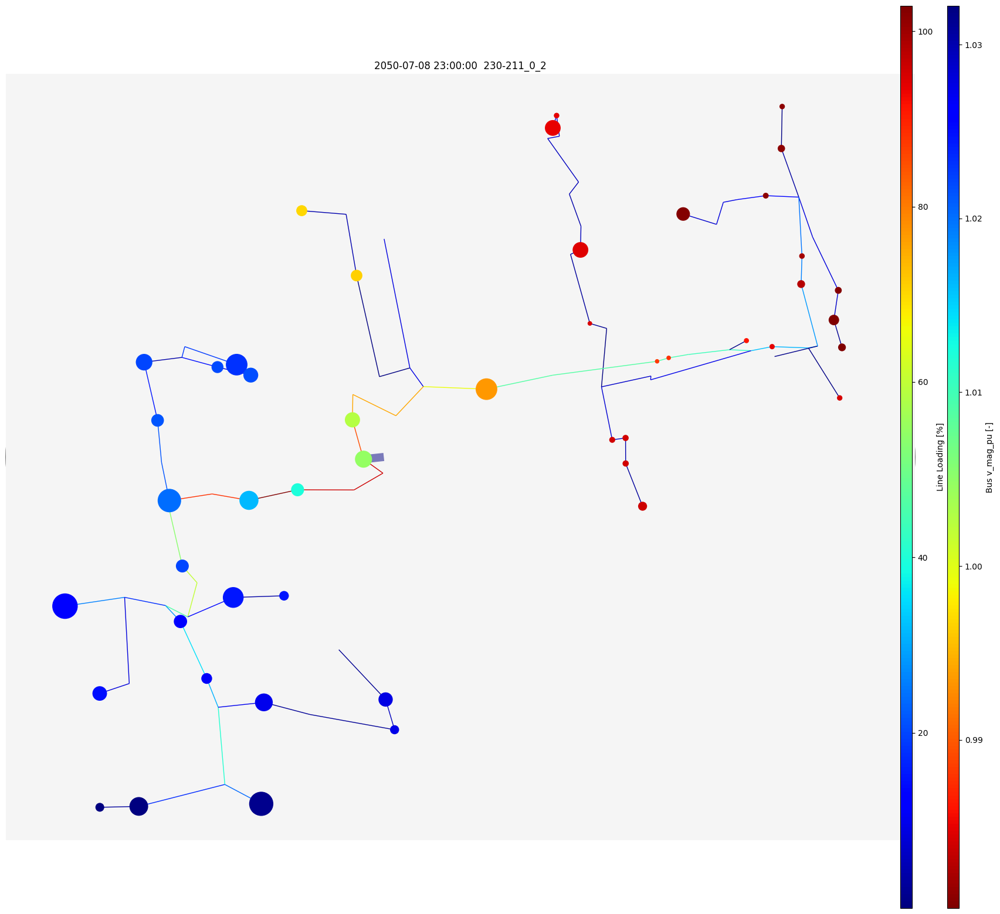

In [52]:
loading_res=loading_res(net_optimized)
hourly_visualize(MV_feeder,net_optimized, None, loading_res)

In [22]:
def plot_profiles(net_optimized,net):#save_paths
    base_load_idx = net_optimized.loads.loc[net.loads.index.str.contains('base')].index
    # ev_load_idx = net_optimized.loads.loc[net.loads.index.str.contains('ev')].index
    pv_optimized_idx = net_optimized.generators.loc[net.generators.index.str.contains('PV')].index
    # pv_idx = net.generators.loc[net.generators.index.str.contains('PV')].index
    plt.subplots(figsize=(10, 6))
    plt.plot(net_optimized.loads_t.p_set[base_load_idx].sum(axis=1), label='building base')
    plt.plot(net.storage_units_t.p_set[net.storage_units_t.p_set>=0].sum(axis=1),label='ev discharge')
    plt.plot(-net.storage_units_t.p_set[net.storage_units_t.p_set<0].sum(axis=1),label='ev charge')
    plt.plot(net_optimized.storage_units_t.p_dispatch.sum(axis=1),label='ev discharge optimized')
    plt.plot(net_optimized.storage_units_t.p_store.sum(axis=1),label='ev charge optmized')
    plt.plot(net_optimized.generators_t.p[pv_optimized_idx].sum(axis=1), label='PV_optimized')
    # plt.plot(net.generators_t.p_set[pv_idx].sum(axis=1),label='PV')
    plt.legend()
    plt.tight_layout()
    plt.show()
    # plt.savefig(f"{save_paths[i]}/network_profiles.png")
    # plt.clf()
    return 0

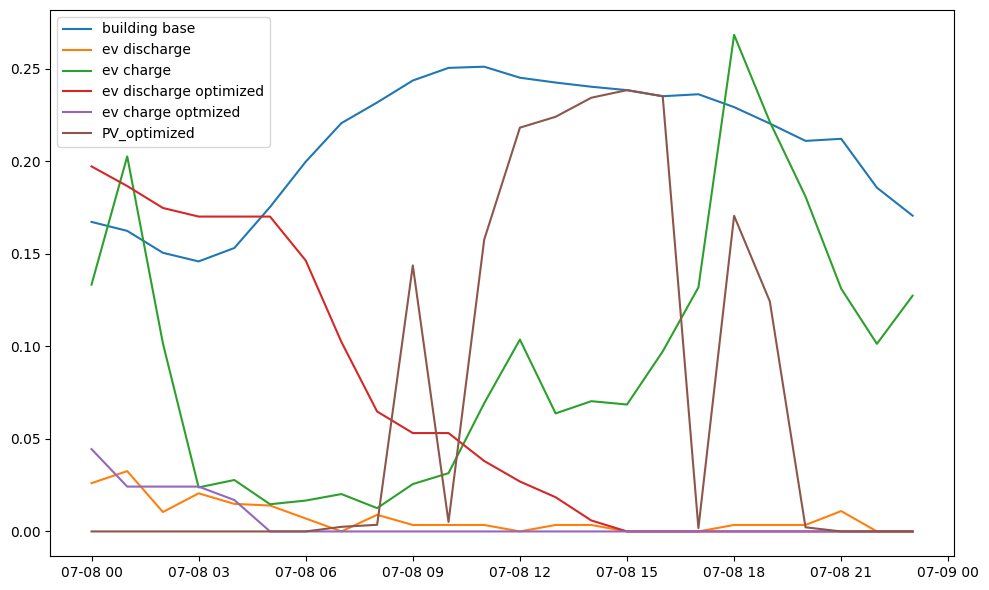

0

In [23]:
plot_profiles(net_optimized,nets[0])

In [27]:
nets[0].storage_units_t.p_set

StorageUnit,ev_187231_1232_230-211_0_2_node_150_nan,ev_456495_8934_230-211_0_2_node_205_nan,ev_478279_18392_230-211_0_2_node_105_nan,ev_513989_33179_230-211_0_2_node_205_nan,ev_2316585_45390_230-211_0_2_node_174_nan,ev_2325841_50411_230-211_0_2_node_150_nan,ev_2330069_51287_230-211_0_2_node_150_nan,ev_2338596_54470_230-211_0_2_node_150_nan,ev_2338858_54702_230-211_0_2_node_105_nan,ev_2343601_56701_230-211_0_2_node_150_nan,...,ev_8636580_1077256_230-211_0_2_node_11_nan,ev_8636580_1077260_230-211_0_2_node_11_nan,ev_8638754_1078768_230-211_0_2_node_174_13,ev_8645924_1083352_230-211_0_2_node_150_nan,ev_8660771_1092019_230-211_0_2_node_173_nan,ev_8666908_1095614_230-211_0_2_node_189_nan,ev_8666908_1095618_230-211_0_2_node_189_nan,ev_8666909_1095630_230-211_0_2_node_189_0,ev_8666909_1095632_230-211_0_2_node_189_18,ev_8670903_1098217_230-211_0_2_node_150_nan
snapshot,,,,,,,,,,,,,,,,,,,,,
2050-07-08 00:00:00,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,...,-0.0,-0.0,-0.0000,-0.0,-0.0,-0.0,-0.0,-0.007,-0.0000,-0.0
2050-07-08 01:00:00,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,...,-0.0,-0.0,-0.0000,-0.0,-0.0,-0.0,-0.0,-0.000,-0.0000,-0.0
2050-07-08 02:00:00,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,...,-0.0,-0.0,-0.0000,-0.0,-0.0,-0.0,-0.0,-0.000,-0.0000,-0.0
2050-07-08 03:00:00,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,...,-0.0,-0.0,-0.0000,-0.0,-0.0,-0.0,-0.0,-0.000,-0.0000,-0.0
2050-07-08 04:00:00,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,...,-0.0,-0.0,-0.0000,-0.0,-0.0,-0.0,-0.0,-0.000,-0.0000,-0.0
2050-07-08 05:00:00,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,...,-0.0,-0.0,-0.0000,-0.0,-0.0,-0.0,-0.0,-0.000,-0.0000,-0.0
2050-07-08 06:00:00,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,...,-0.0,-0.0,-0.0000,-0.0,-0.0,-0.0,-0.0,-0.000,-0.0000,-0.0
2050-07-08 07:00:00,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,...,-0.0,-0.0,-0.0000,-0.0,-0.0,-0.0,-0.0,-0.000,-0.0000,-0.0
2050-07-08 08:00:00,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,...,-0.0,-0.0,-0.0000,-0.0,-0.0,-0.0,-0.0,-0.000,-0.0000,-0.0


In [39]:
bus_ev_dict = net_optimized.storage_units.groupby('bus').groups

In [43]:
bus_ev_dict.keys()

dict_keys(['230-211_0_2_node_0', '230-211_0_2_node_1', '230-211_0_2_node_105', '230-211_0_2_node_107', '230-211_0_2_node_108', '230-211_0_2_node_109', '230-211_0_2_node_11', '230-211_0_2_node_115', '230-211_0_2_node_117', '230-211_0_2_node_118', '230-211_0_2_node_119', '230-211_0_2_node_120', '230-211_0_2_node_123', '230-211_0_2_node_127', '230-211_0_2_node_128', '230-211_0_2_node_13', '230-211_0_2_node_131', '230-211_0_2_node_149', '230-211_0_2_node_150', '230-211_0_2_node_151', '230-211_0_2_node_155', '230-211_0_2_node_173', '230-211_0_2_node_174', '230-211_0_2_node_177', '230-211_0_2_node_180', '230-211_0_2_node_188', '230-211_0_2_node_189', '230-211_0_2_node_193', '230-211_0_2_node_194', '230-211_0_2_node_195', '230-211_0_2_node_196', '230-211_0_2_node_197', '230-211_0_2_node_198', '230-211_0_2_node_199', '230-211_0_2_node_200', '230-211_0_2_node_201', '230-211_0_2_node_203', '230-211_0_2_node_205', '230-211_0_2_node_206', '230-211_0_2_node_207', '230-211_0_2_node_208', '230-211_0_

In [80]:
net_optimized.storage_units_t.p[bus_ev_dict['230-211_0_2_node_6'].to_list()].sum(axis=1)+net_optimized.generators_t.p[['PV_230-211_0_2_node_6_5617566', 'PV_230-211_0_2_node_6_5617593',
       'PV_230-211_0_2_node_6_5617541']].sum(axis=1)-net_optimized.loads_t.p['base_load_230-211_0_2_6']

snapshot
2050-07-08 00:00:00    0.005448
2050-07-08 01:00:00    0.005470
2050-07-08 02:00:00    0.005518
2050-07-08 03:00:00    0.005540
2050-07-08 04:00:00    0.005494
2050-07-08 05:00:00    0.005361
2050-07-08 06:00:00    0.005235
2050-07-08 07:00:00   -0.001026
2050-07-08 08:00:00   -0.001073
2050-07-08 09:00:00   -0.001126
2050-07-08 10:00:00   -0.001153
2050-07-08 11:00:00   -0.001145
2050-07-08 12:00:00   -0.001122
2050-07-08 13:00:00   -0.001082
2050-07-08 14:00:00   -0.001075
2050-07-08 15:00:00   -0.001078
2050-07-08 16:00:00   -0.001051
2050-07-08 17:00:00   -0.001037
2050-07-08 18:00:00    0.036429
2050-07-08 19:00:00   -0.000964
2050-07-08 20:00:00   -0.000919
2050-07-08 21:00:00   -0.000940
2050-07-08 22:00:00   -0.000832
2050-07-08 23:00:00   -0.000759
Freq: h, dtype: float64

In [75]:
net_optimized.buses_t.p['230-211_0_2_node_6']

snapshot
2050-07-08 00:00:00    0.005448
2050-07-08 01:00:00    0.005470
2050-07-08 02:00:00    0.005518
2050-07-08 03:00:00    0.005540
2050-07-08 04:00:00    0.005494
2050-07-08 05:00:00    0.005361
2050-07-08 06:00:00    0.005235
2050-07-08 07:00:00   -0.001026
2050-07-08 08:00:00   -0.001073
2050-07-08 09:00:00   -0.001126
2050-07-08 10:00:00   -0.001153
2050-07-08 11:00:00   -0.001145
2050-07-08 12:00:00   -0.001122
2050-07-08 13:00:00   -0.001082
2050-07-08 14:00:00   -0.001075
2050-07-08 15:00:00   -0.001078
2050-07-08 16:00:00   -0.001051
2050-07-08 17:00:00   -0.001037
2050-07-08 18:00:00    0.036429
2050-07-08 19:00:00   -0.000964
2050-07-08 20:00:00   -0.000919
2050-07-08 21:00:00   -0.000940
2050-07-08 22:00:00   -0.000832
2050-07-08 23:00:00   -0.000759
Freq: h, Name: 230-211_0_2_node_6, dtype: float64